# Imports

In [2]:
import warnings
warnings.filterwarnings('ignore')
import scrapy
from scrapy.crawler import CrawlerProcess
import re
import pandas as pd
from urllib.parse import urlparse, parse_qs, urlencode, urlunparse
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

# Convert to CSV files

In [ ]:
import os

def save_dfs_to_csv(df_dict, path):
    """
    Saves each DataFrame in the dictionary to a CSV file with a '_csv' suffix.

    Parameters:
    - df_dict (dict): Dictionary containing DataFrames with their names as keys.
    - path (str): The directory path where the CSV files will be saved.

    Returns:
    - None
    """
    # Ensure the directory exists
    os.makedirs(path, exist_ok=True)
    
    # Iterate through the DataFrame dictionary
    for name, df in df_dict.items():
        # Define the full file path with '_csv' suffix
        file_path = os.path.join(path, f"{name}_csv.csv")
        
        # Save the DataFrame as a CSV file
        df.to_csv(file_path, index=False)  # No index in CSV
        
        print(f"Saved: {file_path}")

    print("All DataFrames have been saved.")


In [ ]:
import pandas as pd
import os

path_b = os.path.join('Data', 'csv_Bavli', 'df_hor_csv.csv')
path_y = os.path.join('Data', 'csv_Yerushalmi', 'df_yer_hor_csv.csv')

df_b = pd.read_csv(path_b)
df_y = pd.read_csv(path_y)

df = pd.concat([df_b, df_y], ignore_index=True)

print("הנתונים נטענו בהצלחה! עכשיו אפשר להריץ את התא הבלשי.")

הנתונים נטענו בהצלחה! עכשיו אפשר להריץ את התא הבלשי.


In [ ]:
#Take the column, throw away empty cells and convert to text
raw_lexicon = df['merged_lexicon'].dropna().astype(str)

#Turn into single words
all_tokens = raw_lexicon.str.split().explode().unique()

#Cleaning . , () and converting to an alphabetical list 
final_tags = sorted(list(set([token.strip('.,()') for token in all_tokens if token])))

print(f"נמצאו {len(final_tags)} תגיות ייחודיות. הנה הרשימה המלאה:")
print(final_tags)

נמצאו 46 תגיות ייחודיות. הנה הרשימה המלאה:
['Geographic', 'I01', 'No', 'P', 'Personal', 'R', 'V', 'X', 'a01', 'abs', 'absolute', 'adjective', 'adverb', 'b', 'conjunction', 'construct', 'data', 'determined', 'emphatic', 'ethpaal', 'ethpay/w', 'ethpeel', 'ethpolal', 'geographical', 'h)aphel', 'independent', 'interjection', 'name', 'noun', 'numeral', 'or', 'pael', 'peal', 'pl', 'plural', 'preposition', 'proclitic', 'pronominal', 'proper', 'quad', 'sg', 'singular', 'suffix', 'verb', 'with', '|']


In [4]:
# Define the LAT_TO_HEB dictionary
LAT_TO_HEB = {
    ')': 'א',
    'b': 'ב',
    'g': 'ג',
    'd': 'ד',
    'h': 'ה',
    'w': 'ו',
    'z': 'ז',
    'x': 'ח',
    'T': 'ט',
    'y': 'י',
    'k': 'כ',
    'K': 'ך',
    'l': 'ל',
    'm': 'מ',
    'M': 'ם',
    'n': 'נ',
    'N': 'ן',
    's': 'ס',
    '(': 'ע',
    'p': 'פ',
    'P': 'ף',
    'c': 'צ',
    'C': 'ץ',
    'q': 'ק',
    'r': 'ר',
    '$': 'ש',
    '&': 'שׂ',
    't': 'ת',
    '"': '',
    '^': '',
}

# Function to replace Latin characters with Hebrew
def replace_with_heb_chars(word: str) -> str:
    return ''.join(LAT_TO_HEB.get(char, char) for char in word)

def lat_to_heb(st: str) -> str:
    words = st.split()
    heb_words = [replace_with_heb_chars(word) for word in words]
    return ' '.join(heb_words)

# Define all the transformation functions
def replace_sub(orig_str: str, start: int, end: int, replacement: str) -> str:
    return orig_str[:start] + replacement + orig_str[end + 1:]

def r3_slash_slash2(st: str) -> str:
    cont1 = r"(?P<cont1>\\[^/]+|[^/ ]+)"
    cont2 = r"(?P<cont2>[^/]*/)"
    return re.sub(rf"{cont1}\s*/{cont2}", '\g<cont2>', st)

def r3_slash_slash(st: str) -> str:
    r3 = re.compile(r'(cont) "/" (cont) "/"')
    matches = r3.finditer(st)
    if not matches:
        return st
    new_st = st
    for match in reversed(list(matches)):
        start = match.start()
        end = match.end()
        new_st = replace_sub(
            new_st,
            start,
            end - 1,
            new_st[match.start(1): match.end(1)]
        )
    return new_st

def r_5_4_hash_hash(st: str) -> str:
    return re.sub(r'#[^#]*#', '', st)

def r2_squigglie_slash_slash(st: str) -> str:
    return re.sub(r'"/"', '', st)

def r11_double_squiggles(st: str) -> str:
    return re.sub(r'\{\{|\}\}', '', st)

def r12_14_question(st: str) -> str:
    return re.sub(r'\?', '', st)

def r1_squiggles(st: str) -> str:
    return re.sub(r'\{[^{}]*\}', '', st)

def r6_quotes(st: str) -> str:
    # Remove all substrings enclosed in double quotes
    return re.sub(r'"[^"]*"', '', st)

def r8_7_dots(st: str) -> str:
    return re.sub(r'\.{2,}', '', st)

def r9_chevrons(st: str) -> str:
    return re.sub(r'[<>]', '', st)

def r10_carets(st: str) -> str:
    return re.sub(r'\^[^^]*\^', '', st)

def r13_backslash(st: str) -> str:
    return st.replace('\\', '')

def r15_caret(st: str) -> str:
    return re.sub(r'\^', '', st)

def r16_comma(st: str) -> str:
    return re.sub(r',', '', st)

def r17_plus(st: str) -> str:
    return re.sub(r'\+', '', st)

def r18_at_equals_dash(st: str) -> str:
    return st.replace('@', ' ').replace('=', '').replace('-', '')

def r19_squiggle_space(st: str) -> str:
    return st.replace('{ ', ' ')

def r20_remove_braces(st: str) -> str:
    return st.replace('[', '').replace(']', '')

def r21_remove_bang(st: str) -> str:
    return st.replace('!', '')

def r22_backtick_to_space(st: str) -> str:
    return st.replace('`', ' ')

def r_WS(st: str) -> str:
    st = re.sub(r' +', ' ', st)
    st = st.strip()
    return st

def transform_str(st: str) -> str:
    st = lat_to_heb(st)  # Apply Latin to Hebrew transformation first
    rules = [
        r9_chevrons,
        r_5_4_hash_hash,
        r16_comma,
        r12_14_question,
        r10_carets,
        r15_caret,
        r17_plus,
        r8_7_dots,
        r3_slash_slash2,
        r6_quotes,
        r13_backslash,
        r2_squigglie_slash_slash,
        r11_double_squiggles,
        r1_squiggles,
        r18_at_equals_dash,
        r19_squiggle_space,
        r20_remove_braces,
        r21_remove_bang,
        r22_backtick_to_space,
        r_WS
    ]

    for f in rules:
        st = f(st)
    return st

def apply_transformation(df: pd.DataFrame, column_name: str) -> pd.DataFrame:
    df[f'{column_name}_transformed'] = df[column_name].apply(transform_str)
    return df

if __name__ == "__main__":
    # Create a sample DataFrame
    df_check = pd.DataFrame({'text': ['^tn)^', '"lytny"']})
    
    # Apply transformation
    df_check = apply_transformation(df_check, 'text')
    
    # Display the transformed DataFrame


# Sort

In [5]:

def replace_x_in_coord(url: str) -> str:
    # Parse the URL
    parsed_url = urlparse(url)
    query_params = parse_qs(parsed_url.query)
    
    # Get and modify the 'coord' parameter
    coord = query_params.get('coord', [''])[0]
    coord = coord.replace('x', '1')
    
    # Update query parameters
    query_params['coord'] = [coord]
    
    # Rebuild the URL with updated parameters
    new_query_string = urlencode(query_params, doseq=True)
    new_url = urlunparse((
        parsed_url.scheme,
        parsed_url.netloc,
        parsed_url.path,
        parsed_url.params,
        new_query_string,
        parsed_url.fragment
    ))
    
    return new_url




In [6]:

def sort_by_coord_and_word(df, url_column='url'):
    # Extract 'coord' and 'word' values using str.extract
    df[['coord', 'word']] = df[url_column].str.extract(r'coord=(\d+)&word=(\d+)')

    # Ignore the first 7 digits of 'coord', and handle NaN values by filling them with a placeholder
    df['coord'] = df['coord'].str[7:].fillna('0')
    df['word'] = df['word'].fillna('0')

    # Convert 'coord' and 'word' to integers for correct sorting
    df['coord'] = df['coord'].astype(int)
    df['word'] = df['word'].astype(int)

    # Sort by 'coord' and then by 'word'
    sorted_df = df.sort_values(by=['coord', 'word'], ascending=[True, True])

    # Drop the temporary columns 'coord' and 'word'
    sorted_df = sorted_df.drop(columns=['coord', 'word'])

    return sorted_df

# Clean text

In [7]:
import pandas as pd
import numpy as np

def process_text(text):
    # Check if the text is None or not a string
    if text is None or not isinstance(text, str):
        return None, text  # Return None for Lema and keep original text if not a string
    
    # Extract the first word (to be deleted)
    words = text.split()
    first_word = words[0] if words else None
    
    # Extract the part before the '=' (to be deleted)
    parts = text.split('=')
    part_before_equals = parts[0].strip() if len(parts) > 1 else None
    
    # Combine first word and part before '=' as the deleted portion
    deleted_part = None
    if first_word and part_before_equals:
        deleted_part = f'{first_word} {part_before_equals}'
    elif first_word:
        deleted_part = first_word
    elif part_before_equals:
        deleted_part = part_before_equals
    
    # Update the remaining text by removing the deleted parts
    remaining_text = text
    if first_word:
        remaining_text = ' '.join(words[1:])  # Remove the first word
    if part_before_equals:
        remaining_text = remaining_text.split('=')[-1].strip()  # Keep only the part after '='
    
    # Replace the specific phrase if needed
    if "is no data for this word" in remaining_text:
        remaining_text = "No data"
    
    return deleted_part, remaining_text

def clean_text_df(df):
    # Initialize an empty column for the Lema
    df['Lema'] = np.nan
    
    # Apply the processing to each lexicon column
    for i in range(5):  # Adjust the range if you have more or fewer lexicon columns
        column_name = f'lexicon_{i}'
        
        # Ensure the column is treated as string type and replace empty values with None
        df[column_name] = df[column_name].astype(str).replace('', None)

        # Apply the text processing to extract and remove the deleted part
        df[['deleted', column_name]] = df[column_name].apply(lambda text: pd.Series(process_text(text)))
        
        # Handle cases where the lexicon contains "-->"
        if (df[column_name].str.contains("-->", na=False)).any():
            # Update lexicon to keep only the last character if "-->" is present
            df[column_name] = df[column_name].apply(lambda text: text.split()[-1] if "-->" in text else text)

        # If the current lexicon contains "-->", take the next lexicon's deleted part
        next_column_name = f'lexicon_{i + 1}' if i + 1 < 5 else None
        if next_column_name and next_column_name in df.columns:
            df['Lema'] = df['Lema'].fillna(df[next_column_name].apply(lambda text: process_text(text)[0]))

        # Add the deleted parts to 'Lema' only if it is not None and doesn't contain "-->"
        df['Lema'] = df['Lema'].fillna(df['deleted'].where(~df[column_name].str.contains('-->', na=False)))

        # Replace any occurrence of "there" in Lema with None
        df['Lema'] = df['Lema'].replace("there", None)

        # Replace empty values in lexicon columns with None
        df[column_name] = df[column_name].replace('', None)

        # Drop the temporary 'deleted' column after processing
        df.drop('deleted', axis=1, inplace=True)

    return df

# Example usage:
# Assuming you have a DataFrame 'df' with 'lexicon_0', 'lexicon_1', etc.
# df = clean_text_df(df)
# print(df)


# Merge lexicons

In [8]:
import numpy as np

def merge_lexicons(row):
    merged_text = []
    for i in range(5):  # Adjust the range if you have more or fewer columns
        column_name = f'lexicon_{i}'
        text = row[column_name]
        
        # Skip None or NaN values
        if pd.isna(text) or text == 'None' or text == 'nan':
            continue
        
        # Split text by '|'
        parts = text.split('|')
        
        # Append non-empty parts
        merged_text.extend(part.strip() for part in parts if part.strip())
    
    # Join all parts with '|'
    return ' | '.join(merged_text)




# Merge meanings

In [9]:
def merge_meanings(row):
    merged_meanings = []
    for i in range(4):  
        column_name = f'meaning_{i}'
        text = row[column_name]
        
        # Skip None or NaN values, but don't return None immediately
        if pd.isna(text) or text in ['None', 'nan', '']:
            continue
        
        # Split text by '|'
        parts = text.split('|')
        
        # Append non-empty parts
        merged_meanings.extend(part.strip() for part in parts if part.strip())
    
    # Return merged meanings if any exist, otherwise return None
    return ' | '.join(merged_meanings) if merged_meanings else None


# URL to location

In [10]:
def url_to_location(df, url_column='url'):
    # Extract 'coord' and 'word' values using str.extract
    df[['coord', 'word']] = df[url_column].str.extract(r'coord=(\d+)&word=(\d+)')

    # Define a function to parse and transform the 'coord' field and handle 'word'
    def parse_coord_and_word(coord, word):
        if pd.isna(coord):
            return (0, '000', 0, '00', 0)  # Default values for missing cases
        coord = coord.zfill(12)  # Ensure the coord string is zero-padded to 12 digits
        masekhet = coord[:5]  # Masekhet: first 5 digits
        page = coord[7:10].zfill(3)  # Page: next 2 digits, padded to 3 digits
        side = int(coord[10])  # Side: next digit
        line = coord[11:].zfill(2)  # Line: last 2 digits, padded to 2 digits
        word_value = int(word) if not pd.isna(word) else 0  # Handle missing word
        return (masekhet, page, side, line, word_value)

    # Apply the parsing function to the 'coord' and 'word' columns
    df[['masekhet', 'page', 'side', 'line', 'word']] = df.apply(lambda row: pd.Series(parse_coord_and_word(row['coord'], row['word'])), axis=1)

    # Create the formatted column and replace the original 'url' column with it
    df[url_column] = df.apply(lambda row: f"Masekhet: {row['masekhet']}, Page: {row['page']}, Side: {row['side']}, Line: {row['line']}, Word: {row['word']}", axis=1)

    # Sort by 'masekhet', 'page', 'side', 'line', and then by 'word'
    sorted_df = df.sort_values(by=['masekhet', 'page', 'side', 'line', 'word'], ascending=[True, True, True, True, True])

    # Drop the temporary columns 'coord', 'masekhet', 'page', 'side', 'line'
    sorted_df = sorted_df.drop(columns=['coord', 'masekhet', 'page', 'side', 'line','word'])

    return sorted_df

# Remove empty rows with no meaning

In [11]:
def remove_empty_rows(df: pd.DataFrame, column_name: str) -> pd.DataFrame:

    # Filter out rows where the specified column is NaN or an empty string
    cleaned_df = df[~df[column_name].isna() & (df[column_name] != '')]
    
    return cleaned_df



# Replace Lexicon

In [12]:
import pandas as pd

# Define the lexicon swap dictionary to map abbreviations to full terms
lexicon_swap_dict_reversed = {
    'G': 'peal',
    'D': 'pael',
    'C': '(h)aphel',
    'Gt': 'ethpeel',
    'Dt': 'ethpaal',
    'Ct': 'ettaphal',
    'Q': 'quadriliteral',
    'Qt': 'reflexive quadriliteral',
    'N': 'noun',
    'N01': 'noun singular absolute or construct',
    'N02': 'noun singular determined',
    'N03': 'noun plural absolute',
    'N04': 'noun plural construct',
    'N05': 'noun plural determined',
    'A': 'adjective',
    'A01': 'adjective singular absolute or construct',
    'A02': 'adjective singular determined',
    'A03': 'adjective plural absolute',
    'A04': 'adjective plural construct',
    'A05': 'adjective plural determined',
    'n': 'numeral',
    'n01': 'numeral singular absolute or construct',
    'n02': 'numeral singular determined',
    'n03': 'numeral plural absolute',
    'n04': 'numeral plural construct',
    'n05': 'numeral plural determined',
    'p': 'preposition',
    'p01': 'preposition independent',
    'P01': 'preposition independent',
    'p02': 'preposition with pronominal suffix',
    'P02': 'preposition with pronominal suffix',
    'p03': 'preposition proclitic',
    'P03': 'preposition proclitic',
    'c': 'conjunction',
    'a': 'adverb',
    'I': 'interjection',
    'GN': 'geographical name',
    'd': 'divine name',
    'PN': 'proper name'
}

# Function to map lexicons in a string that may contain multiple entries separated by '|'
def replace_lexicons(lexicon_str):
    if pd.isna(lexicon_str):
        return lexicon_str
    # Split by space to check for verbs like 'verb G'
    parts = lexicon_str.split()
    # Replace lexicon abbreviations that are found in the dictionary
    updated_parts = [lexicon_swap_dict_reversed.get(part, part) for part in parts]
    return ' '.join(updated_parts)







# Data Process For Bavli

In [13]:
import pandas as pd



def data_process(file_path): 
    # Read the JSON file into a DataFrame
    df = pd.read_json(file_path)

    # Apply transformation
    df = apply_transformation(df, 'text')

    # Apply the transformation to the 'url' column
    df['url'] = df['url'].apply(replace_x_in_coord)

    # Sort the DataFrame by 'coord' and 'word'
    sorted_df = sort_by_coord_and_word(df)
    
    # Clean text in the DataFrame
    clean_df = clean_text_df(sorted_df)
    
    # Merge lexicons and meanings
    clean_df['merged_lexicon'] = clean_df.apply(merge_lexicons, axis=1)
    clean_df['merged_meanings'] = clean_df.apply(merge_meanings, axis=1)

    # Remove empty rows based on 'text_transformed'
    clean_df = remove_empty_rows(clean_df, 'text_transformed')

    # Process URLs into locations
    clean_df = url_to_location(clean_df)

    # Apply the function to the 'merged_lexicon' column
    clean_df['merged_lexicon'] = clean_df['merged_lexicon'].apply(replace_lexicons)

    # Now, apply the function to the 'Lema' column to keep only the first word
    clean_df = keep_first_word_in_lema(clean_df)

    # Return the final processed DataFrame
    return clean_df


# Data Process For Yerushalmi

In [14]:
def data_process_yer(file_path): 
    
    # Read the JSON file into a DataFrame
    df = pd.read_json(file_path)

    # Apply transformation
    df = apply_transformation(df, 'text')
    
    # List of lexicon columns
    lexicon_columns = ['lexicon_0', 'lexicon_1', 'lexicon_2', 'lexicon_3', 'lexicon_4']
    
    df = add_space_to_lexicon_columns(df, lexicon_columns)

    # Apply the transformation
    df['url'] = df['url'].apply(replace_x_in_coord)

#     # Assuming your DataFrame is named 'df' and has a column 'url'
#     sorted_df = sort_by_coord_and_word(df)
    
    clean_df = clean_text_df(df)
    
    clean_df['merged_lexicon'] = clean_df.apply(merge_lexicons, axis=1)
    
    clean_df['merged_meanings'] = clean_df.apply(merge_meanings, axis=1)

    
    clean_df = remove_empty_rows(clean_df, 'text_transformed')
    
    df = url_to_location_yer(clean_df)
    
    # Apply the function to the 'merged_lexicon' column in your DataFrame
    df['merged_lexicon'] = df['merged_lexicon'].apply(replace_lexicons)


    # Display the sorted DataFrame
    return df

# Add Space To Lexicon Columns

In [15]:
import pandas as pd
import re

def add_space_to_lexicon_columns(df, columns):
    # Define the regex pattern that matches any word ending with 'C'
    pattern = r'([A-Za-z0-9]+)(C)'
    
    # Loop over each column and apply the regex substitution
    for column in columns:
        df[column] = df[column].apply(lambda x: re.sub(pattern, r'\1 C', x) if pd.notnull(x) else x)
    
    return df


# Url To Location Yerushalmi

In [16]:
import pandas as pd

def url_to_location_yer(df, url_column='url'):
    # Extract 'coord' and 'word' values using str.extract
    df[['coord', 'word']] = df[url_column].str.extract(r'coord=([0-9a-zA-Z]+)&word=(\d+)')

    # Define a function to parse and transform the 'coord' field and handle 'word'
    def parse_coord_and_word(coord, word):
        if pd.isna(coord):
            return ('0000000', '00', 'a', '00', 0)  # Default values for missing cases
        
        # Ensure that 'coord' is long enough before processing (handling missing characters)
        masekhet = coord[:7]  # Masekhet: first 7 digits
        page = coord[7:9]  # Page: next 2 digits
        side = coord[9].lower()  # Side: letter (a, b, c, d)
        line = coord[10:12]  # Line: next 2 digits
        word_value = int(word) if not pd.isna(word) else 0  # Handle missing word
        
        return (masekhet, page, side, line, word_value)

    # Apply the parsing function to the 'coord' and 'word' columns
    df[['masekhet', 'page', 'side', 'line', 'word']] = df.apply(lambda row: pd.Series(parse_coord_and_word(row['coord'], row['word'])), axis=1)

    # Create the formatted column and replace the original 'url' column with it
    df[url_column] = df.apply(lambda row: f"Masekhet: {row['masekhet']}, Page: {row['page']}, Side: {row['side']}, Line: {row['line']}, Word: {row['word']}", axis=1)

    # Sort by 'masekhet', 'page', 'side', 'line', and then by 'word'
    sorted_df = df.sort_values(by=['masekhet', 'page', 'side', 'line', 'word'], ascending=[True, True, True, True, True])

    # Drop the temporary columns 'coord', 'masekhet', 'page', 'side', 'line'
    sorted_df = sorted_df.drop(columns=['coord', 'masekhet', 'page', 'side', 'line','word'])

    return sorted_df

# Clean Lema

In [17]:
# Function to keep only the first word in the 'Lema' column
def keep_first_word_in_lema(df):
    df['Lema'] = df['Lema'].apply(lambda x: x.split()[0] if isinstance(x, str) and len(x.split()) > 0 else x)
    return df


# Convert to Dataframe

In [18]:

# Path to the JSON file
# file_path = r'C:\Users\david\OneDrive\Desktop\Final_Project\Data\Data_bav\Masekhet_ber.json'
file_path = r'C:\Users\USER\Desktop\Final_Project\Data\Data_bav\Masekhet_ber.json'


# Read the JSON file into a DataFrame
df = pd.read_json(file_path)

# Display the DataFrame
#df

In [19]:
# Count the number of None and NaN values in each column
null_counts = df.isnull().sum()

# Display the count of None and NaN values for each column
print(null_counts)

text             0
url              0
lexicon_0        0
lexicon_1    14246
lexicon_2    17490
lexicon_3    17533
lexicon_4    17537
meaning_0     3907
meaning_1    11233
meaning_2    13893
meaning_3    14706
dtype: int64


In [20]:
# To check unique values in a specific column, e.g., 'text'
unique_values = df['lexicon_3'].unique()

# Display the unique values
print(unique_values)


[None 'Trz noun pl. emphatic' '(lm noun sg. emphatic'
 'm(rb noun sg. emphatic']


In [21]:
# To check unique values in a specific column, e.g., 'text'
unique_values = df['lexicon_2'].unique()

# Display the unique values
#print(unique_values)


# Translation

In [22]:
# Create a sample DataFrame
# df = pd.DataFrame({'text': ['tn)', 'lytny']})
    
# Apply transformation
df = apply_transformation(df, 'text')
    
# Display the transformed DataFrame
#df

In [23]:
# Apply the transformation
df['url'] = df['url'].apply(replace_x_in_coord)

# Assuming your DataFrame is named 'df' and has a column 'url'
sorted_df = sort_by_coord_and_word(df)

# Display the sorted DataFrame
#sorted_df

In [24]:
# Count empty values in the specified column
empty_count = sorted_df['text_transformed'].isna().sum() + (sorted_df['text_transformed'] == '').sum()

print(f"Number of empty values in the column: {empty_count}")

Number of empty values in the column: 55


In [25]:
# Filter rows with empty values
empty_rows = sorted_df[sorted_df['text_transformed'].isna() | (sorted_df['text_transformed'] == '')]

# Print the empty rows
print("Rows where 'text_transformed' is empty:")
#empty_rows


Rows where 'text_transformed' is empty:


# Dataframe converter

In [26]:
# check_df = data_process(r'C:\Users\david\OneDrive\Desktop\Final_Project\Data\Data_Bav\Masekhet_er.json')
check_df = data_process_yer(r'C:\Users\USER\Desktop\Final_Project\Data\Data_Yer\Masekhet_yer_az.json')

In [27]:
check_df

,text,url,lexicon_0,lexicon_1,lexicon_2,lexicon_3,lexicon_4,meaning_0,meaning_1,meaning_2,meaning_3,text_transformed,Lema,merged_lexicon,merged_meanings
0,"""ywM","Masekhet: 5330037, Page: 39, Side: b, Line: 01...",No data,None,None,None,None,None,None,None,None,יום,None,No data,None
4467,$mlK,"Masekhet: 5330037, Page: 39, Side: b, Line: 01...",No data,None,None,None,None,None,None,None,None,שמלך,None,No data,None
4468,yrb(M,"Masekhet: 5330037, Page: 39, Side: b, Line: 01...",No data,None,None,None,None,None,None,None,None,ירבעם,None,No data,None
4469,(l,"Masekhet: 5330037, Page: 39, Side: b, Line: 01...",No data,None,None,None,None,None,None,None,None,על,None,No data,None
4466,"y$r)l""","Masekhet: 5330037, Page: 39, Side: b, Line: 01...",No data,None,None,None,None,None,None,None,None,ישראל,None,No data,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54,w$)lwN,"Masekhet: 5330037, Page: 45, Side: b, Line: 49...",verb G,c,None,None,None,to ask,to ask for something,None,None,ושאלון,w_,verb peal | conjunction,to ask | to ask for something
53,ksP,"Masekhet: 5330037, Page: 45, Side: b, Line: 49...",noun sg. abs. or construct,None,None,None,None,"silver, money",None,None,None,כסף,ksp,noun sg. abs. or construct,"silver, money"
52,mN,"Masekhet: 5330037, Page: 45, Side: b, Line: 49...",p01,None,None,None,None,from,None,None,None,מן,mn,preposition independent,from
51,)ylyN,"Masekhet: 5330037, Page: 45, Side: b, Line: 49...",R,None,None,None,None,these (m. and f.),None,None,None,אילין,)ylyyn )ylyyn P01 C,R,these (m. and f.)


# Analyze

# Create Dataframes to all the Masekhetot

In [28]:
import os
import pandas as pd

# Directory path

data_dir = r"C:\Users\USER\Desktop\Final_Project\Data\Data_Bav"

# List to store DataFrames and their names
arr_dfs = []
df_dict = {}  # Dictionary to store DataFrame names and their corresponding DataFrames

# Loop through all JSON files in the directory
for filename in os.listdir(data_dir):
    if filename.endswith(".json"):
        # Extract the part after the underscore and before the dot
        df_name = filename.split('_')[1].split('.')[0]
        
        # Create the full path to the file
        file_path = os.path.join(data_dir, filename)
        # Apply data processing to the DataFrame
        df = data_process(file_path)
        # Assign the processed DataFrame to a variable dynamically
        globals()[f"df_{df_name}"] = df
        # Store the name of the DataFrame in the list
        arr_dfs.append(f"df_{df_name}")
        # Store the DataFrame in the dictionary
        df_dict[f"df_{df_name}"] = df


In [29]:
save_dfs_to_csv(df_dict,r"C:\Users\USER\Desktop\Final_Project\Data\csv_Bavli")


Saved: C:\Users\USER\Desktop\Final_Project\Data\csv_Bavli\df_ara_csv.csv
Saved: C:\Users\USER\Desktop\Final_Project\Data\csv_Bavli\df_az_csv.csv
Saved: C:\Users\USER\Desktop\Final_Project\Data\csv_Bavli\df_bb_csv.csv
Saved: C:\Users\USER\Desktop\Final_Project\Data\csv_Bavli\df_bek_csv.csv
Saved: C:\Users\USER\Desktop\Final_Project\Data\csv_Bavli\df_ber_csv.csv
Saved: C:\Users\USER\Desktop\Final_Project\Data\csv_Bavli\df_bes_csv.csv
Saved: C:\Users\USER\Desktop\Final_Project\Data\csv_Bavli\df_bm_csv.csv
Saved: C:\Users\USER\Desktop\Final_Project\Data\csv_Bavli\df_bq_csv.csv
Saved: C:\Users\USER\Desktop\Final_Project\Data\csv_Bavli\df_er_csv.csv
Saved: C:\Users\USER\Desktop\Final_Project\Data\csv_Bavli\df_git_csv.csv
Saved: C:\Users\USER\Desktop\Final_Project\Data\csv_Bavli\df_hag_csv.csv
Saved: C:\Users\USER\Desktop\Final_Project\Data\csv_Bavli\df_hor_csv.csv
Saved: C:\Users\USER\Desktop\Final_Project\Data\csv_Bavli\df_hul_csv.csv
Saved: C:\Users\USER\Desktop\Final_Project\Data\csv_Bavl

In [30]:
df_yom

,text,url,lexicon_0,lexicon_1,lexicon_2,lexicon_3,lexicon_4,meaning_0,meaning_1,meaning_2,meaning_3,text_transformed,Lema,merged_lexicon,merged_meanings
0,tqynw,"Masekhet: 71006, Page: 002, Side: 1, Line: 17,...",verb D,None,None,None,None,"to establish properly, correct","to place, install","to ordain, declare",None,תקינו,tqn,verb pael,"to establish properly, correct | to place, ins..."
11766,lyh,"Masekhet: 71006, Page: 002, Side: 1, Line: 17,...",p02,None,None,None,None,"to, for",None,None,None,ליה,l_,preposition with pronominal suffix,"to, for"
11765,rbnN,"Masekhet: 71006, Page: 002, Side: 1, Line: 17,...",N,None,None,None,None,"lord, master",None,None,None,רבנן,rbnn,noun,"lord, master"
11764,dl),"Masekhet: 71006, Page: 002, Side: 1, Line: 18,...",c,a,None,None,None,"who,which (relative)","no, not",None,None,דלא,l),conjunction | adverb,"who,which (relative) | no, not"
11759,mqbly,"Masekhet: 71006, Page: 002, Side: 1, Line: 18,...",verb D,None,None,None,None,"to receive, to accept",idioms:,None,None,מקבלי,qbl,verb pael,"to receive, to accept | idioms:"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
151,)m';,"Masekhet: 71006, Page: 088, Side: 1, Line: 33,...",verb G,None,None,None,None,to say,to command,to think,idiomatic and special usages:,אמ';,)mr,verb peal,to say | to command | to think | idiomatic and...
150,mpy$,"Masekhet: 71006, Page: 088, Side: 1, Line: 33,...",verb C,None,None,None,None,"to expand something, make have more space","to make numerous, increase an amount",None,None,מפיש,np$,verb (h)aphel,"to expand something, make have more space | to..."
155,xyy;,"Masekhet: 71006, Page: 088, Side: 1, Line: 33,...",noun pl. emphatic,None,None,None,None,life,None,None,None,חיי;,xyy,noun pl. emphatic,life
153,sgy,"Masekhet: 71006, Page: 088, Side: 1, Line: 33,...",verb G,None,None,None,None,to be(come) many,to grow,to be sufficient for someone,None,סגי,sgy,verb peal,to be(come) many | to grow | to be sufficient ...


# Number of Words in Each Masekhet 

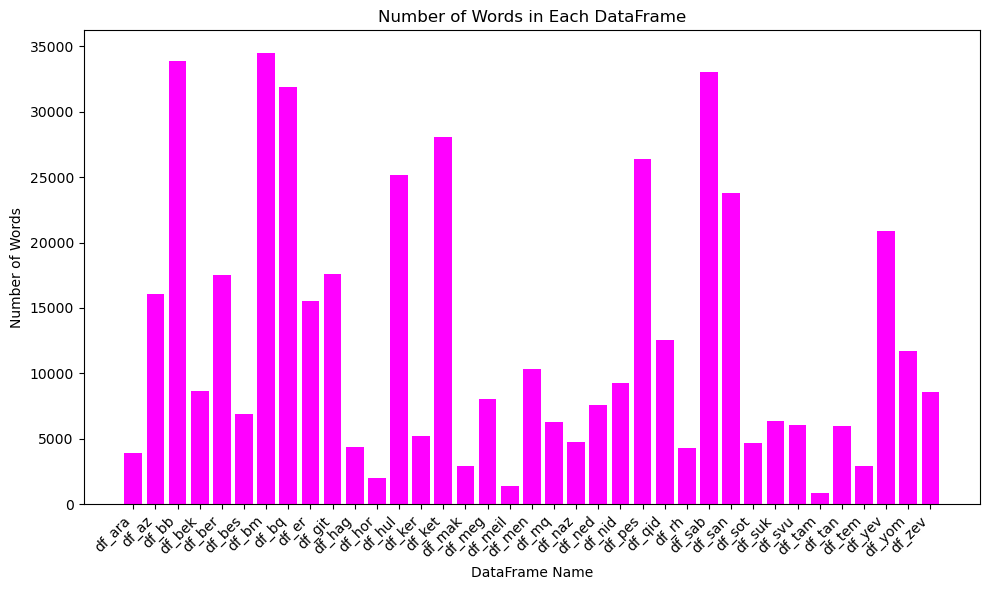

In [31]:
import matplotlib.pyplot as plt

# Dictionary to store DataFrame names and their row counts
df_row_counts = {df_name: globals()[df_name].shape[0] for df_name in arr_dfs}

# Create a bar graph
plt.figure(figsize=(10, 6))
plt.bar(df_row_counts.keys(), df_row_counts.values(), color='magenta')
plt.xlabel('DataFrame Name')
plt.ylabel('Number of Words')
plt.title('Number of Words in Each DataFrame')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Show the plot
plt.show()


# Count of "verb" in merged_lexicon Column for Each Masekhet

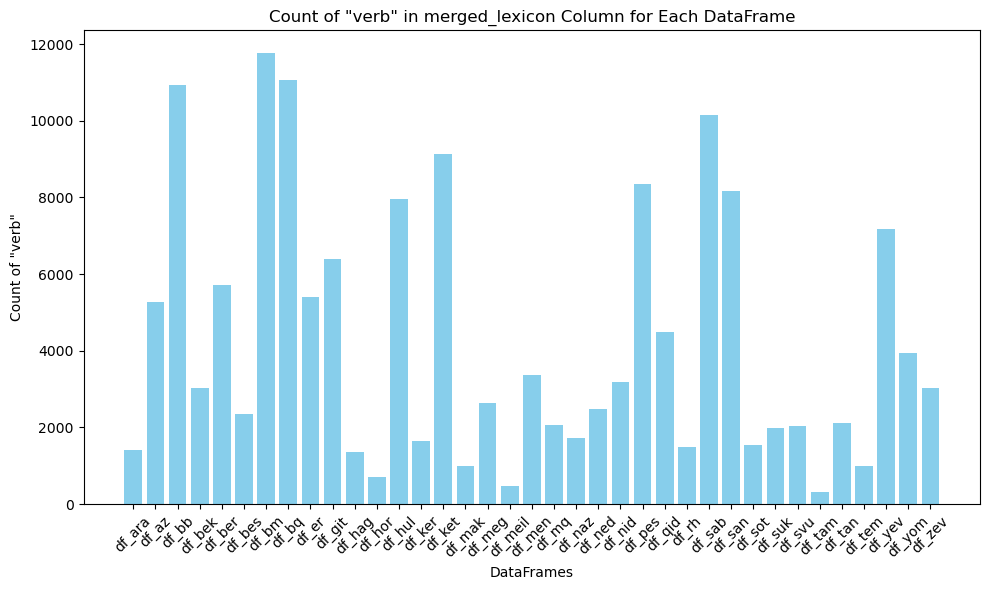

In [32]:
# Dictionary to store counts of 'verb' for each DataFrame
verb_counts = {}

# Count occurrences of 'verb' in the 'merged_lexicon' column for each DataFrame
for df_name in arr_dfs:
    df = globals().get(df_name)  # Retrieve the DataFrame by name
    if df is not None:
        count = df['merged_lexicon'].str.contains('verb', case=False, na=False).sum()
        verb_counts[df_name] = count

# Plot the results
plt.figure(figsize=(10, 6))
plt.bar(verb_counts.keys(), verb_counts.values(), color='skyblue')
plt.xlabel('DataFrames')
plt.ylabel('Count of "verb"')
plt.title('Count of "verb" in merged_lexicon Column for Each DataFrame')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Verb type counts for each Maskhet

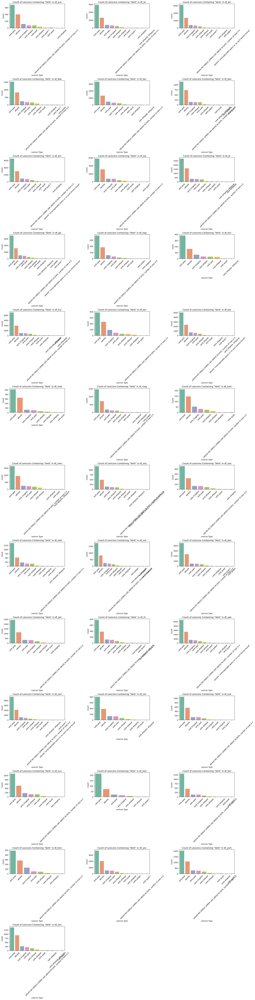

In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

lexicon_comparison = {}

# Number of DataFrames to plot
num_dfs = len(arr_dfs)
dfs_per_row = 3

# Calculate the number of rows needed
num_rows = (num_dfs + dfs_per_row - 1) // dfs_per_row

# Create subplots - Adjust the number of columns and rows as needed
fig, axes = plt.subplots(num_rows, dfs_per_row, figsize=(20, 6 * num_rows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Process each DataFrame
for idx, df_name in enumerate(arr_dfs):
    # Access the DataFrame using globals()
    df = globals()[df_name]

    # Split the merged_lexicon into individual lexicons, strip spaces
    df_exploded = df['merged_lexicon'].str.split('|').apply(lambda x: [item.strip() for item in x]).explode()

    # Filter lexicons that contain the word 'verb' (case-insensitive)
    verb_df = df_exploded[df_exploded.str.contains('verb', case=False, na=False)]

    # Count occurrences of lexicons containing 'verb'
    verb_count = verb_df.value_counts().reset_index()
    verb_count.columns = ['lexicon', 'count']

    # Store the results in the dictionary
    lexicon_comparison[df_name] = verb_count

    # Plotting the individual bar graph for each DataFrame on its respective axis
    sns.barplot(x='lexicon', y='count', data=verb_count, palette='Set2', ax=axes[idx])
    axes[idx].set_title(f'Count of Lexicons Containing "Verb" in {df_name}')
    axes[idx].set_xlabel('Lexicon Type')
    axes[idx].set_ylabel('Count')
    axes[idx].tick_params(axis='x', rotation=45)

# Hide any unused subplots if the number of DataFrames isn't a perfect multiple of dfs_per_row
for i in range(num_dfs, len(axes)):
    axes[i].set_visible(False)

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


# The ratio of verbs in each Maskhet to the total amount of words

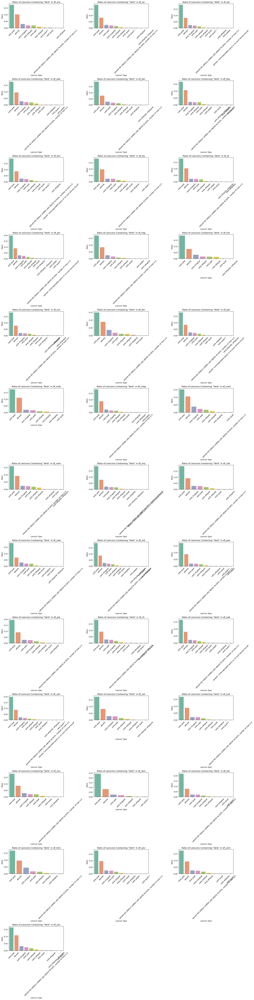

In [34]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

lexicon_comparison = {}
verb_averages = {}

# Number of DataFrames to plot
num_dfs = len(arr_dfs)
dfs_per_row = 3

# Calculate the number of rows needed
num_rows = (num_dfs + dfs_per_row - 1) // dfs_per_row

# Create subplots - Adjust the number of columns and rows as needed
fig, axes = plt.subplots(num_rows, dfs_per_row, figsize=(20, 6 * num_rows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Process each DataFrame
for idx, df_name in enumerate(arr_dfs):
    # Access the DataFrame using globals()
    df = globals()[df_name]

    # Split the merged_lexicon into individual lexicons, strip spaces
    df_exploded = df['merged_lexicon'].str.split('|').apply(lambda x: [item.strip() for item in x]).explode()

    # Filter lexicons that contain the word 'verb' (case-insensitive)
    verb_df = df_exploded[df_exploded.str.contains('verb', case=False, na=False)]

    # Count occurrences of lexicons containing 'verb'
    verb_count = verb_df.value_counts().reset_index()
    verb_count.columns = ['lexicon', 'count']

    # Calculate the ratio of each lexicon count to the total number of rows in the original DataFrame
    verb_count['ratio'] = verb_count['count'] / len(df)

    # Store the results in the dictionary for individual DataFrame comparison
    lexicon_comparison[df_name] = verb_count

    # Update the verb_averages dictionary
    for _, row in verb_count.iterrows():
        lexicon = row['lexicon']
        ratio = row['ratio']
        if lexicon in verb_averages:
            verb_averages[lexicon].append(ratio)
        else:
            verb_averages[lexicon] = [ratio]

    # Plotting the individual bar graph for each DataFrame on its respective axis
    sns.barplot(x='lexicon', y='ratio', data=verb_count, palette='Set2', ax=axes[idx])
    axes[idx].set_title(f'Ratio of Lexicons Containing "Verb" in {df_name}')
    axes[idx].set_xlabel('Lexicon Type')
    axes[idx].set_ylabel('Ratio')
    axes[idx].tick_params(axis='x', rotation=45)

# Hide any unused subplots if the number of DataFrames isn't a perfect multiple of dfs_per_row
for i in range(num_dfs, len(axes)):
    axes[i].set_visible(False)

# Calculate the average ratio for each lexicon across all DataFrames
verb_avg_ratios = {lexicon: sum(ratios) / len(ratios) for lexicon, ratios in verb_averages.items()}

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

# Difference from Average for each verb (compare to total words)

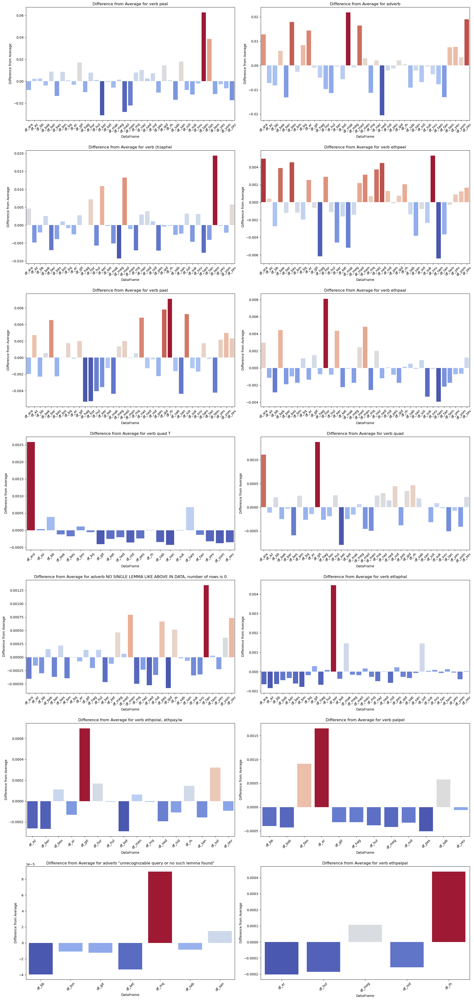

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Prepare the data for plotting
diffs_list = []

for df_name, verb_count in lexicon_comparison.items():
    # Merge each DataFrame's lexicon ratio with the average ratios
    verb_count = verb_count.merge(pd.DataFrame(verb_avg_ratios.items(), columns=['lexicon', 'avg_ratio']),
                                  on='lexicon', how='left')
    # Calculate the difference between the current ratio and the average ratio
    verb_count['diff'] = verb_count['ratio'] - verb_count['avg_ratio']
    
    # Add the DataFrame name as a column
    verb_count['df_name'] = df_name
    
    # Append to the list
    diffs_list.append(verb_count[['lexicon', 'diff', 'df_name']])

# Concatenate all differences into a single DataFrame
diffs_df = pd.concat(diffs_list)

# Now create the plots for each lexicon type
unique_verbs = diffs_df['lexicon'].unique()
num_verbs = len(unique_verbs)
dfs_per_row = 2

# Calculate the number of rows needed
num_rows = (num_verbs + dfs_per_row - 1) // dfs_per_row

# Create subplots
fig, axes = plt.subplots(num_rows, dfs_per_row, figsize=(20, 6 * num_rows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Define a color map
cmap = plt.get_cmap('coolwarm')

# Plot the difference for each lexicon across all DataFrames
for idx, lexicon in enumerate(unique_verbs):
    # Filter data for the current lexicon
    lexicon_data = diffs_df[diffs_df['lexicon'] == lexicon]
    
    # Normalize the differences for color mapping
    norm = plt.Normalize(lexicon_data['diff'].min(), lexicon_data['diff'].max())
    colors = cmap(norm(lexicon_data['diff']))

    # Plotting the differences for this lexicon
    sns.barplot(x='df_name', y='diff', data=lexicon_data, palette=colors, ax=axes[idx])
    axes[idx].set_title(f'Difference from Average for {lexicon}')
    axes[idx].set_xlabel('DataFrame')
    axes[idx].set_ylabel('Difference from Average')
    axes[idx].tick_params(axis='x', rotation=45)

# Hide any unused subplots if the number of lexicons isn't a perfect multiple of dfs_per_row
for i in range(num_verbs, len(axes)):
    axes[i].set_visible(False)

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


# The ratio of verbs in each Maskhet to the total amount of verbs in each Maskhet

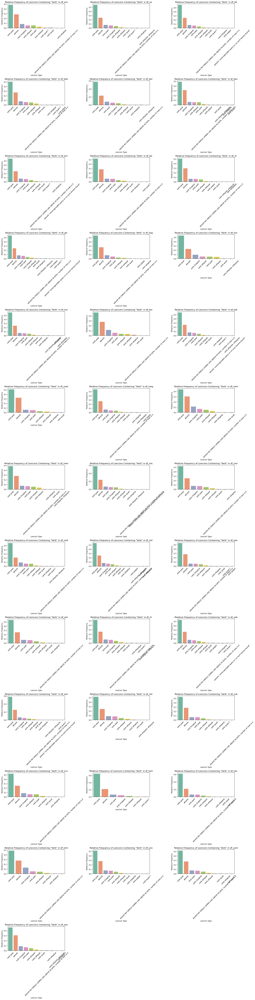

In [36]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

lexicon_comparison = {}

# Number of DataFrames to plot
num_dfs = len(arr_dfs)
dfs_per_row = 3

# Calculate the number of rows needed
num_rows = (num_dfs + dfs_per_row - 1) // dfs_per_row

# Create subplots - Adjust the number of columns and rows as needed
fig, axes = plt.subplots(num_rows, dfs_per_row, figsize=(20, 6 * num_rows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Process each DataFrame
for idx, df_name in enumerate(arr_dfs):
    # Access the DataFrame using globals()
    df = globals()[df_name]

    # Split the merged_lexicon into individual lexicons, strip spaces
    df_exploded = df['merged_lexicon'].str.split('|').apply(lambda x: [item.strip() for item in x]).explode()

    # Filter lexicons that contain the word 'verb' (case-insensitive)
    verb_df = df_exploded[df_exploded.str.contains('verb', case=False, na=False)]

    # Count occurrences of lexicons containing 'verb'
    verb_count = verb_df.value_counts().reset_index()
    verb_count.columns = ['lexicon', 'count']

    # Calculate the total number of verbs in the DataFrame
    total_verbs = verb_count['count'].sum()

    # Add a new column for the relative frequency (proportion of each verb type)
    verb_count['relative_frequency'] = verb_count['count'] / total_verbs

    # Store the results in the dictionary
    lexicon_comparison[df_name] = verb_count

    # Plotting the relative frequency bar graph for each DataFrame on its respective axis
    sns.barplot(x='lexicon', y='relative_frequency', data=verb_count, palette='Set2', ax=axes[idx])
    axes[idx].set_title(f'Relative Frequency of Lexicons Containing "Verb" in {df_name}')
    axes[idx].set_xlabel('Lexicon Type')
    axes[idx].set_ylabel('Relative Frequency')
    axes[idx].tick_params(axis='x', rotation=45)

# Hide any unused subplots if the number of DataFrames isn't a perfect multiple of dfs_per_row
for i in range(num_dfs, len(axes)):
    axes[i].set_visible(False)

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

# Difference from Average for each verb (compare to total words)

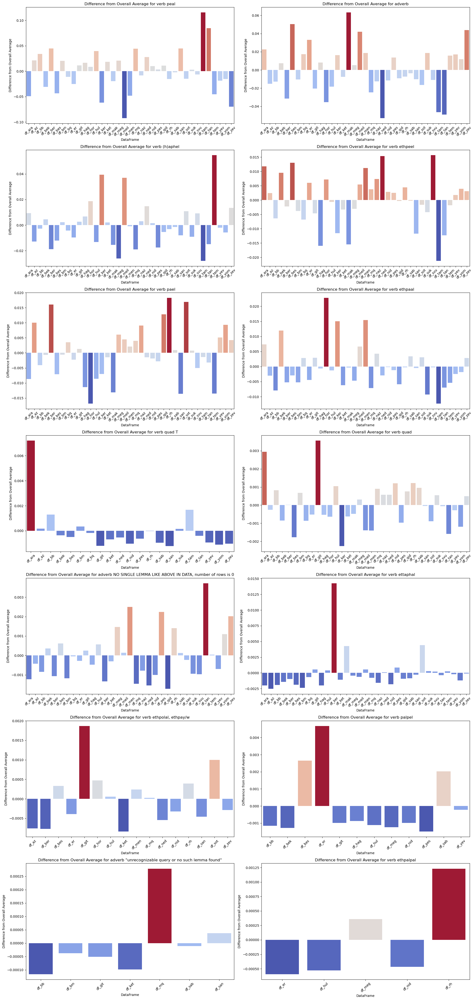

In [37]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Prepare the data for plotting
all_verb_counts = pd.concat([lexicon_comparison[df_name] for df_name in arr_dfs])
overall_average = all_verb_counts.groupby('lexicon')['relative_frequency'].mean().reset_index()
overall_average.rename(columns={'relative_frequency': 'overall_avg'}, inplace=True)

# Step 2: Create a new DataFrame to compare each DataFrame's average with the overall average
comparison_list = []

for df_name, verb_count in lexicon_comparison.items():
    # Merge with overall average
    merged = verb_count.merge(overall_average, on='lexicon', how='left')
    
    # Calculate the difference
    merged['diff'] = merged['relative_frequency'] - merged['overall_avg']
    merged['df_name'] = df_name
    
    # Append to the list
    comparison_list.append(merged[['lexicon', 'relative_frequency', 'overall_avg', 'diff', 'df_name']])

# Concatenate all comparisons into a single DataFrame
comparison_df = pd.concat(comparison_list)

# Step 3: Now create the plots for each lexicon type
unique_verbs = comparison_df['lexicon'].unique()
num_verbs = len(unique_verbs)
dfs_per_row = 2

# Calculate the number of rows needed
num_rows = (num_verbs + dfs_per_row - 1) // dfs_per_row

# Create subplots
fig, axes = plt.subplots(num_rows, dfs_per_row, figsize=(20, 6 * num_rows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Define a color map
cmap = plt.get_cmap('coolwarm')

# Plot the differences for each lexicon across all DataFrames
for idx, lexicon in enumerate(unique_verbs):
    # Filter data for the current lexicon
    lexicon_data = comparison_df[comparison_df['lexicon'] == lexicon]
    
    # Normalize the differences for color mapping
    norm = plt.Normalize(lexicon_data['diff'].min(), lexicon_data['diff'].max())
    colors = cmap(norm(lexicon_data['diff']))

    # Plotting the differences for this lexicon
    sns.barplot(x='df_name', y='diff', data=lexicon_data, palette=colors, ax=axes[idx])
    axes[idx].set_title(f'Difference from Overall Average for {lexicon}')
    axes[idx].set_xlabel('DataFrame')
    axes[idx].set_ylabel('Difference from Overall Average')
    axes[idx].tick_params(axis='x', rotation=45)

# Hide any unused subplots if the number of lexicons isn't a perfect multiple of dfs_per_row
for i in range(num_verbs, len(axes)):
    axes[i].set_visible(False)

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


# Noun counts

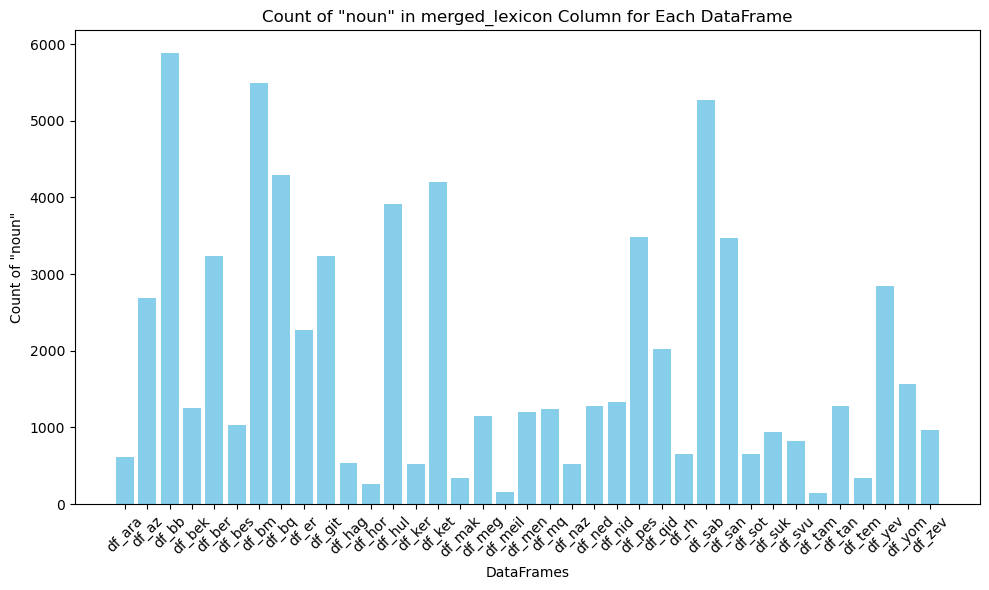

In [38]:
# Dictionary to store counts of 'noun' for each DataFrame
noun_counts = {}

# Count occurrences of 'verb' in the 'merged_lexicon' column for each DataFrame
for df_name in arr_dfs:
    df = globals().get(df_name)  # Retrieve the DataFrame by name
    if df is not None:
        count = df['merged_lexicon'].str.contains('noun', case=False, na=False).sum()
        noun_counts[df_name] = count

# Plot the results
plt.figure(figsize=(10, 6))
plt.bar(verb_counts.keys(), noun_counts.values(), color='skyblue')
plt.xlabel('DataFrames')
plt.ylabel('Count of "noun"')
plt.title('Count of "noun" in merged_lexicon Column for Each DataFrame')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Verb counts and ratio for each Maskhet

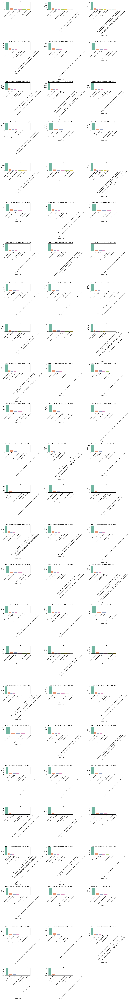

In [39]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Number of DataFrames to plot
num_dfs = len(arr_dfs)
dfs_per_row = 3

# Calculate the number of rows needed
num_rows = (num_dfs + dfs_per_row - 1) // dfs_per_row

# Create subplots - Adjust the number of columns and rows as needed
fig, axes = plt.subplots(num_rows * 2, dfs_per_row, figsize=(20, 6 * num_rows * 2))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Process each DataFrame
for idx, df_name in enumerate(arr_dfs):
    # Access the DataFrame using globals()
    df = globals()[df_name]

    # Split the merged_lexicon into individual lexicons, strip spaces
    df_exploded = df['merged_lexicon'].str.split('|').apply(lambda x: [item.strip() for item in x]).explode()

    # Filter lexicons that contain the word 'noun' (case-insensitive)
    noun_df = df_exploded[df_exploded.str.contains('noun', case=False, na=False)]

    # Count occurrences of lexicons containing 'noun'
    noun_count = noun_df.value_counts().reset_index()
    noun_count.columns = ['lexicon', 'count']

    # Calculate the total number of rows in the DataFrame
    total_rows = len(df)

    # Calculate the ratio of each lexicon count to the total number of rows
    noun_count['ratio'] = noun_count['count'] / total_rows

    # Store the results in the dictionary
    lexicon_comparison[df_name] = noun_count

    # Plotting the bar graph for absolute counts
    sns.barplot(x='lexicon', y='count', data=noun_count, palette='Set2', ax=axes[idx])
    axes[idx].set_title(f'Count of Lexicons Containing "Noun" in {df_name}')
    axes[idx].set_xlabel('Lexicon Type')
    axes[idx].set_ylabel('Count')
    axes[idx].tick_params(axis='x', rotation=45)

    # Plotting the bar graph for ratios
    sns.barplot(x='lexicon', y='ratio', data=noun_count, palette='Set2', ax=axes[idx + num_dfs])
    axes[idx + num_dfs].set_title(f'Ratio of Lexicons Containing "Noun" in {df_name}')
    axes[idx + num_dfs].set_xlabel('Lexicon Type')
    axes[idx + num_dfs].set_ylabel('Ratio')
    axes[idx + num_dfs].tick_params(axis='x', rotation=45)

# Hide any unused subplots if the number of DataFrames isn't a perfect multiple of dfs_per_row
for i in range(num_dfs * 2, len(axes)):
    axes[i].set_visible(False)

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


In [40]:
import pandas as pd
import plotly.express as px

# Extract the page number from the URL
df_tan['page'] = df_tan['url'].str.extract(r'Page:\s*(\d+)')

# Group by the extracted page number
grouped = df_tan.groupby('page').agg({
    'merged_lexicon': lambda x: ' '.join(x).split()
})

# Count the total number of words and the number of verbs
grouped['total_words'] = grouped['merged_lexicon'].apply(len)
grouped['verb_count'] = grouped['merged_lexicon'].apply(lambda words: sum('verb' in word for word in words))

# Calculate the ratio of verbs to the total number of words
grouped['verb_ratio'] = grouped['verb_count'] / grouped['total_words']

# Reset the index to have the page as a column for plotting
grouped = grouped.reset_index()

# Create a bar graph using Plotly Express
fig = px.bar(grouped, x='page', y='verb_ratio',
             labels={'page': 'Page Number', 'verb_ratio': 'Verb Ratio'},
             title='Ratio of Verbs to Total Words per Page')

# Show the bar graph
fig.show()

In [41]:
# Group by page and merged_lexicon to count occurrences
most_common_lexicons = df_tan.groupby(['page', 'merged_lexicon']).size().reset_index(name='count')

# Find the most common lexicon per page
most_common_lexicon_per_page = most_common_lexicons.loc[most_common_lexicons.groupby('page')['count'].idxmax()]

# Display the result
print(most_common_lexicon_per_page)


    page           merged_lexicon  count
0    002                  No data     30
19   003                  No data     43
59   004                  No data     13
116  005                verb peal     23
132  006        noun sg. emphatic     15
171  007                verb peal     24
172  008                  No data     25
245  009                verb peal     67
247  010                  No data     16
303  011                verb peal     13
304  012                  No data     48
347  013                  No data     27
378  014                  No data     36
419  015  preposition independent      3
425  016                  No data     12
441  017                  No data    128
471  018                  No data     61
504  019                  No data     14
563  020                verb peal     34
620  021                verb peal     98
666  022                verb peal     64
720  023                verb peal    144
788  024                verb peal    161
843  025        

In [42]:
import pandas as pd
import matplotlib.pyplot as plt

# Function to perform the analysis on a given CSV file
def analyze_lexicon_combinations_and_text_length(df):
   
    # Fill NaN values in lexicon columns with 'None' for easier handling
    df_filled = df.fillna('None')

    # Replace 'No data' with 'None' so that they can be excluded
    df_filled = df_filled.replace('No data', 'None')

    # Create a new column that combines all lexicon columns, excluding 'None' values
    df_filled['lexicon_combination'] = df_filled[['lexicon_0', 'lexicon_1', 'lexicon_2', 'lexicon_3', 'lexicon_4']].apply(
        lambda row: tuple(x for x in row if x != 'None'), axis=1)

    # Filter out rows where the combination is empty (no valid lexicon entries)
    df_filled = df_filled[df_filled['lexicon_combination'].apply(len) > 0]

    # Group by these combinations and count their occurrences
    lexicon_combinations_count = df_filled.groupby('lexicon_combination').size().reset_index(name='count')

    # Sort by count for better visualization
    lexicon_combinations_count_sorted = lexicon_combinations_count.sort_values(by='count', ascending=False).head(10)

    # Analyze text length vs merged lexicon type
    df_filled['text_length'] = df_filled['text'].apply(len)

    # Group by merged_lexicon and get the average text length for each lexicon type
    text_length_by_lexicon = df_filled.groupby('merged_lexicon')['text_length'].mean().reset_index()

    # Plot 1: Most Common Lexicon Combinations
    plt.figure(figsize=(10, 6))
    plt.barh(lexicon_combinations_count_sorted['lexicon_combination'].astype(str), lexicon_combinations_count_sorted['count'], color='skyblue')
    plt.xlabel('Count')
    plt.ylabel('Lexicon Combinations')
    plt.title('Top 10 Most Common Lexicon Combinations')
    plt.gca().invert_yaxis()  # To display the most common at the top
    plt.show()



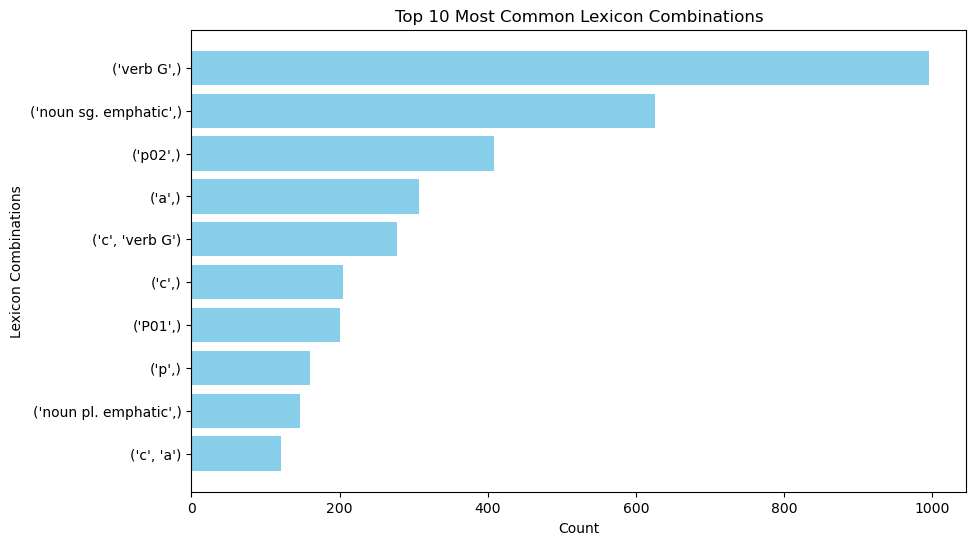

In [43]:
analyze_lexicon_combinations_and_text_length(df_tan)

In [44]:
df_tan

,text,url,lexicon_0,lexicon_1,lexicon_2,lexicon_3,lexicon_4,meaning_0,meaning_1,meaning_2,meaning_3,text_transformed,Lema,merged_lexicon,merged_meanings,page
0,tn{y}),"Masekhet: 71009, Page: 002, Side: 1, Line: 14,...",noun sg. emphatic,None,None,None,None,tanna,None,None,None,תנא,tn),noun sg. emphatic,tanna,002
5989,hyky,"Masekhet: 71009, Page: 002, Side: 1, Line: 14,...",a,None,None,None,None,how,None,None,None,היכי,hyky,adverb,how,002
5988,q)y,"Masekhet: 71009, Page: 002, Side: 1, Line: 14,...",verb G,None,None,None,None,to rise,"to stand, to be raised up","to stand still, to stop",with various prepositions,קאי,qwm,verb peal,"to rise | to stand, to be raised up | to stand...",002
5987,dqt)ny;,"Masekhet: 71009, Page: 002, Side: 1, Line: 14,...",c,verb G,None,None,None,to repeat,"to narrate, recite",to sift flour [< Rabbinic Hebrew],None,דקתאני;,tny,conjunction | verb peal,"to repeat | to narrate, recite | to sift flour...",002
5986,""")ymty"";","Masekhet: 71009, Page: 002, Side: 1, Line: 14,...",No data,None,None,None,None,None,None,None,None,אימתי;,None,No data,None,002
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93,tny,"Masekhet: 71009, Page: 031, Side: 1, Line: 12,...",verb G,None,None,None,None,to repeat,"to narrate, recite",to sift flour [< Rabbinic Hebrew],None,תני,tny,verb peal,"to repeat | to narrate, recite | to sift flour...",031
92,rb,"Masekhet: 71009, Page: 031, Side: 1, Line: 12,...",noun sg. emphatic,None,None,None,None,chief; teacher,None,None,None,רב,rb,noun sg. emphatic,chief; teacher,031
91,ywsP;,"Masekhet: 71009, Page: 031, Side: 1, Line: 12,...",No data,None,None,None,None,None,None,None,None,יוסף;,None,No data,None,031
90,tyqbryh,"Masekhet: 71009, Page: 031, Side: 1, Line: 13,...",verb G,None,None,None,None,to bury,to swell up (?),None,None,תיקבריה,qbr,verb peal,to bury | to swell up (?),031


In [45]:
# Extract the page number from the URL
df_ara['page'] = df_ara['url'].str.extract(r'Page:\s*(\d+)')

# Define the keywords to search for
keywords = ['verb', 'noun', 'adjective', 'pronoun', 'adverb']

# Create an empty DataFrame to store the counts
keyword_count = pd.DataFrame()

# Loop through each keyword and count occurrences
for keyword in keywords:
    # Filter rows that contain the keyword in merged_lexicon
    df_filtered = df_ara[df_ara['merged_lexicon'].str.contains(keyword, na=False)]

    # Count occurrences grouped by page
    counts = df_filtered.groupby('page').size().reset_index(name='count')

    # Add a column to indicate the keyword
    counts['keyword'] = keyword

    # Append to the keyword_count DataFrame
    keyword_count = pd.concat([keyword_count, counts], ignore_index=True)

# Create a bar chart to show the count of each keyword by page
fig = px.bar(keyword_count, x='page', y='count', color='keyword',
             labels={'page': 'Page Number', 'count': 'Count'},
             title='Count of Different Lexicon Categories by Page')

# Show the graph
fig.show()


# Analyze

# Create Dataframes to all the Masekhetot Yerushalmi

In [46]:
import os
import pandas as pd

# Directory path

data_dir_yer = r"C:\Users\USER\Desktop\Final_Project\Data\Data_Yer"

# List to store DataFrames and their names
arr_dfs_yer = []
df_dict_yer = {}  # Dictionary to store DataFrame names and their corresponding DataFrames

# Loop through all JSON files in the directory
for filename in os.listdir(data_dir_yer):
    if filename.endswith(".json"):
        # Extract the part after the underscore and before the dot
        df_name = '_'.join(filename.split('_')[1:]).split('.')[0] #Yerushalmi
        
        # Create the full path to the file
        file_path = os.path.join(data_dir_yer, filename)
        # Apply data processing to the DataFrame
        df = data_process_yer(file_path)
        # Assign the processed DataFrame to a variable dynamically
        globals()[f"df_{df_name}"] = df
        # Store the name of the DataFrame in the list
        arr_dfs_yer.append(f"df_{df_name}")
        # Store the DataFrame in the dictionary
        df_dict_yer[f"df_{df_name}"] = df

In [47]:
save_dfs_to_csv(df_dict_yer,r"C:\Users\USER\Desktop\Final_Project\Data\csv_Yerushalmi")


Saved: C:\Users\USER\Desktop\Final_Project\Data\csv_Yerushalmi\df_yer_az_csv.csv
Saved: C:\Users\USER\Desktop\Final_Project\Data\csv_Yerushalmi\df_yer_bb_csv.csv
Saved: C:\Users\USER\Desktop\Final_Project\Data\csv_Yerushalmi\df_yer_ber_csv.csv
Saved: C:\Users\USER\Desktop\Final_Project\Data\csv_Yerushalmi\df_yer_bes_csv.csv
Saved: C:\Users\USER\Desktop\Final_Project\Data\csv_Yerushalmi\df_yer_bik_csv.csv
Saved: C:\Users\USER\Desktop\Final_Project\Data\csv_Yerushalmi\df_yer_bm_csv.csv
Saved: C:\Users\USER\Desktop\Final_Project\Data\csv_Yerushalmi\df_yer_bq_csv.csv
Saved: C:\Users\USER\Desktop\Final_Project\Data\csv_Yerushalmi\df_yer_dem_csv.csv
Saved: C:\Users\USER\Desktop\Final_Project\Data\csv_Yerushalmi\df_yer_er_csv.csv
Saved: C:\Users\USER\Desktop\Final_Project\Data\csv_Yerushalmi\df_yer_git_csv.csv
Saved: C:\Users\USER\Desktop\Final_Project\Data\csv_Yerushalmi\df_yer_hag_csv.csv
Saved: C:\Users\USER\Desktop\Final_Project\Data\csv_Yerushalmi\df_yer_hal_csv.csv
Saved: C:\Users\USER\

In [48]:
df_yer_az

,text,url,lexicon_0,lexicon_1,lexicon_2,lexicon_3,lexicon_4,meaning_0,meaning_1,meaning_2,meaning_3,text_transformed,Lema,merged_lexicon,merged_meanings
0,"""ywM","Masekhet: 5330037, Page: 39, Side: b, Line: 01...",No data,None,None,None,None,None,None,None,None,יום,None,No data,None
4467,$mlK,"Masekhet: 5330037, Page: 39, Side: b, Line: 01...",No data,None,None,None,None,None,None,None,None,שמלך,None,No data,None
4468,yrb(M,"Masekhet: 5330037, Page: 39, Side: b, Line: 01...",No data,None,None,None,None,None,None,None,None,ירבעם,None,No data,None
4469,(l,"Masekhet: 5330037, Page: 39, Side: b, Line: 01...",No data,None,None,None,None,None,None,None,None,על,None,No data,None
4466,"y$r)l""","Masekhet: 5330037, Page: 39, Side: b, Line: 01...",No data,None,None,None,None,None,None,None,None,ישראל,None,No data,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54,w$)lwN,"Masekhet: 5330037, Page: 45, Side: b, Line: 49...",verb G,c,None,None,None,to ask,to ask for something,None,None,ושאלון,w_,verb peal | conjunction,to ask | to ask for something
53,ksP,"Masekhet: 5330037, Page: 45, Side: b, Line: 49...",noun sg. abs. or construct,None,None,None,None,"silver, money",None,None,None,כסף,ksp,noun sg. abs. or construct,"silver, money"
52,mN,"Masekhet: 5330037, Page: 45, Side: b, Line: 49...",p01,None,None,None,None,from,None,None,None,מן,mn,preposition independent,from
51,)ylyN,"Masekhet: 5330037, Page: 45, Side: b, Line: 49...",R,None,None,None,None,these (m. and f.),None,None,None,אילין,)ylyyn )ylyyn P01 C,R,these (m. and f.)


# Number of Words in Each Masekhet

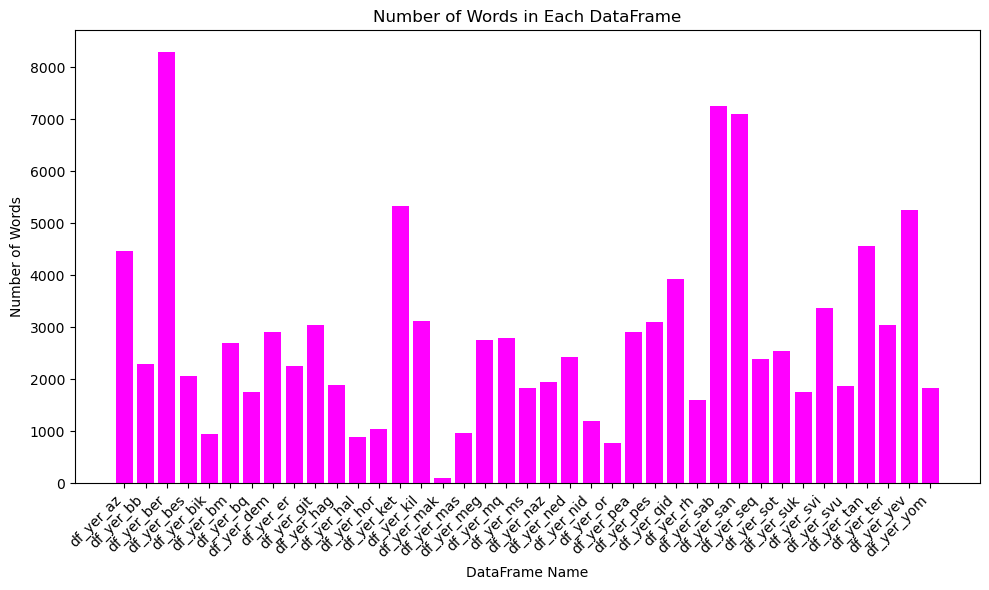

In [49]:
import matplotlib.pyplot as plt

# Dictionary to store DataFrame names and their row counts
df_row_counts = {df_name: globals()[df_name].shape[0] for df_name in arr_dfs_yer}

# Create a bar graph
plt.figure(figsize=(10, 6))
plt.bar(df_row_counts.keys(), df_row_counts.values(), color='magenta')
plt.xlabel('DataFrame Name')
plt.ylabel('Number of Words')
plt.title('Number of Words in Each DataFrame')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Show the plot
plt.show()


# Count of "verb" in merged_lexicon Column for Each DataFrame

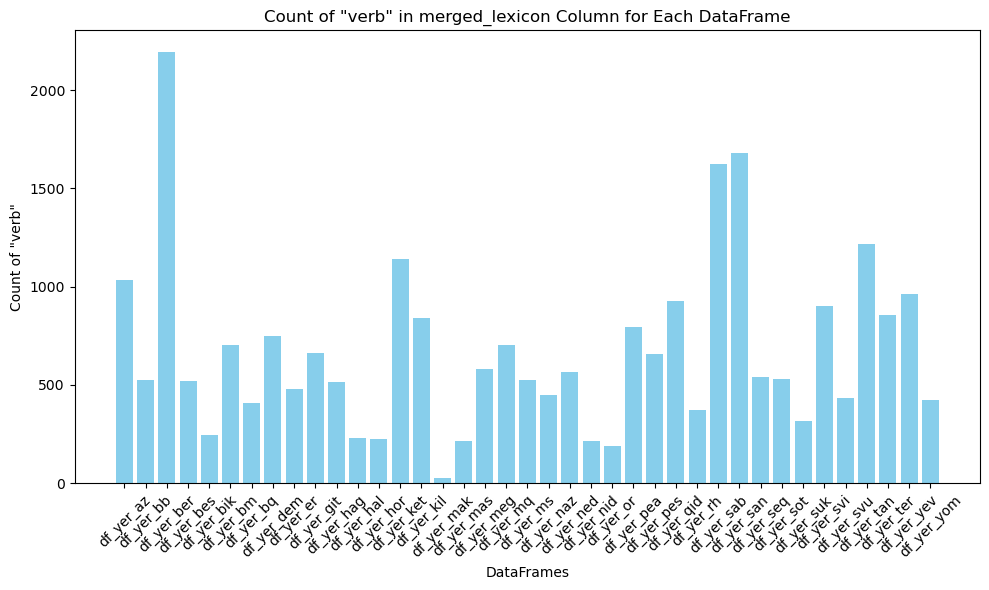

In [50]:
# Dictionary to store counts of 'verb' for each DataFrame
verb_counts = {}

# Count occurrences of 'verb' in the 'merged_lexicon' column for each DataFrame
for df_name in arr_dfs_yer:
    df = globals().get(df_name)  # Retrieve the DataFrame by name
    if df is not None:
        count = df['merged_lexicon'].str.contains('verb', case=False, na=False).sum()
        verb_counts[df_name] = count

# Plot the results
plt.figure(figsize=(10, 6))
plt.bar(verb_counts.keys(), verb_counts.values(), color='skyblue')
plt.xlabel('DataFrames')
plt.ylabel('Count of "verb"')
plt.title('Count of "verb" in merged_lexicon Column for Each DataFrame')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Count of Lexicons Containing "Verb"

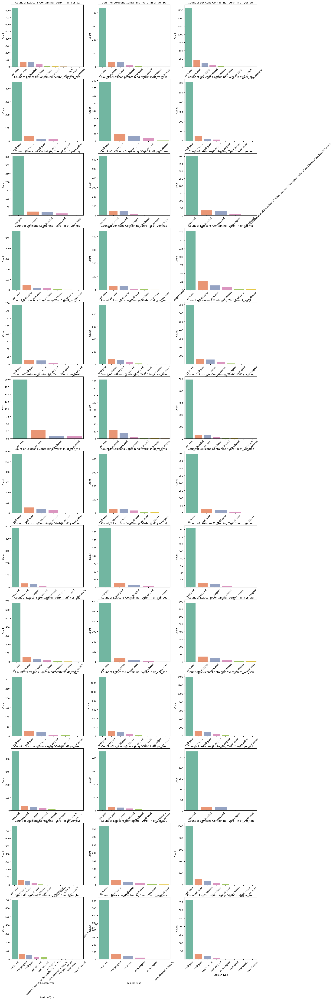

In [51]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

lexicon_comparison = {}

# Number of DataFrames to plot
num_dfs = len(arr_dfs_yer)
dfs_per_row = 3

# Calculate the number of rows needed
num_rows = (num_dfs + dfs_per_row - 1) // dfs_per_row

# Create subplots - Adjust the number of columns and rows as needed
fig, axes = plt.subplots(num_rows, dfs_per_row, figsize=(20, 6 * num_rows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Process each DataFrame
for idx, df_name in enumerate(arr_dfs_yer):
    # Access the DataFrame using globals()
    df = globals()[df_name]

    # Split the merged_lexicon into individual lexicons, strip spaces
    df_exploded = df['merged_lexicon'].str.split('|').apply(lambda x: [item.strip() for item in x]).explode()

    # Filter lexicons that contain the word 'verb' (case-insensitive)
    verb_df = df_exploded[df_exploded.str.contains('verb', case=False, na=False)]

    # Count occurrences of lexicons containing 'verb'
    verb_count = verb_df.value_counts().reset_index()
    verb_count.columns = ['lexicon', 'count']

    # Store the results in the dictionary
    lexicon_comparison[df_name] = verb_count

    # Plotting the individual bar graph for each DataFrame on its respective axis
    sns.barplot(x='lexicon', y='count', data=verb_count, palette='Set2', ax=axes[idx])
    axes[idx].set_title(f'Count of Lexicons Containing "Verb" in {df_name}')
    axes[idx].set_xlabel('Lexicon Type')
    axes[idx].set_ylabel('Count')
    axes[idx].tick_params(axis='x', rotation=45)

# Hide any unused subplots if the number of DataFrames isn't a perfect multiple of dfs_per_row
for i in range(num_dfs, len(axes)):
    axes[i].set_visible(False)

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


# Ratio of Lexicons Containing "Verb"

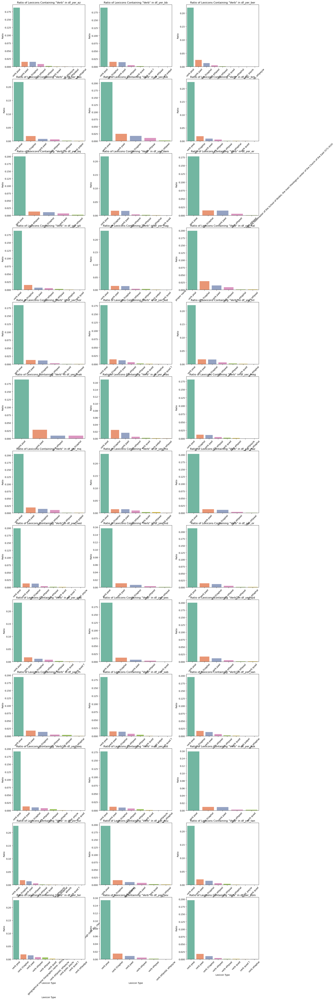

In [52]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

lexicon_comparison = {}
verb_averages = {}

# Number of DataFrames to plot
num_dfs = len(arr_dfs_yer)
dfs_per_row = 3

# Calculate the number of rows needed
num_rows = (num_dfs + dfs_per_row - 1) // dfs_per_row

# Create subplots - Adjust the number of columns and rows as needed
fig, axes = plt.subplots(num_rows, dfs_per_row, figsize=(20, 6 * num_rows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Process each DataFrame
for idx, df_name in enumerate(arr_dfs_yer):
    # Access the DataFrame using globals()
    df = globals()[df_name]

    # Split the merged_lexicon into individual lexicons, strip spaces
    df_exploded = df['merged_lexicon'].str.split('|').apply(lambda x: [item.strip() for item in x]).explode()

    # Filter lexicons that contain the word 'verb' (case-insensitive)
    verb_df = df_exploded[df_exploded.str.contains('verb', case=False, na=False)]

    # Count occurrences of lexicons containing 'verb'
    verb_count = verb_df.value_counts().reset_index()
    verb_count.columns = ['lexicon', 'count']

    # Calculate the ratio of each lexicon count to the total number of rows in the original DataFrame
    verb_count['ratio'] = verb_count['count'] / len(df)

    # Store the results in the dictionary for individual DataFrame comparison
    lexicon_comparison[df_name] = verb_count

    # Update the verb_averages dictionary
    for _, row in verb_count.iterrows():
        lexicon = row['lexicon']
        ratio = row['ratio']
        if lexicon in verb_averages:
            verb_averages[lexicon].append(ratio)
        else:
            verb_averages[lexicon] = [ratio]

    # Plotting the individual bar graph for each DataFrame on its respective axis
    sns.barplot(x='lexicon', y='ratio', data=verb_count, palette='Set2', ax=axes[idx])
    axes[idx].set_title(f'Ratio of Lexicons Containing "Verb" in {df_name}')
    axes[idx].set_xlabel('Lexicon Type')
    axes[idx].set_ylabel('Ratio')
    axes[idx].tick_params(axis='x', rotation=45)

# Hide any unused subplots if the number of DataFrames isn't a perfect multiple of dfs_per_row
for i in range(num_dfs, len(axes)):
    axes[i].set_visible(False)

# Calculate the average ratio for each lexicon across all DataFrames
verb_avg_ratios = {lexicon: sum(ratios) / len(ratios) for lexicon, ratios in verb_averages.items()}

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

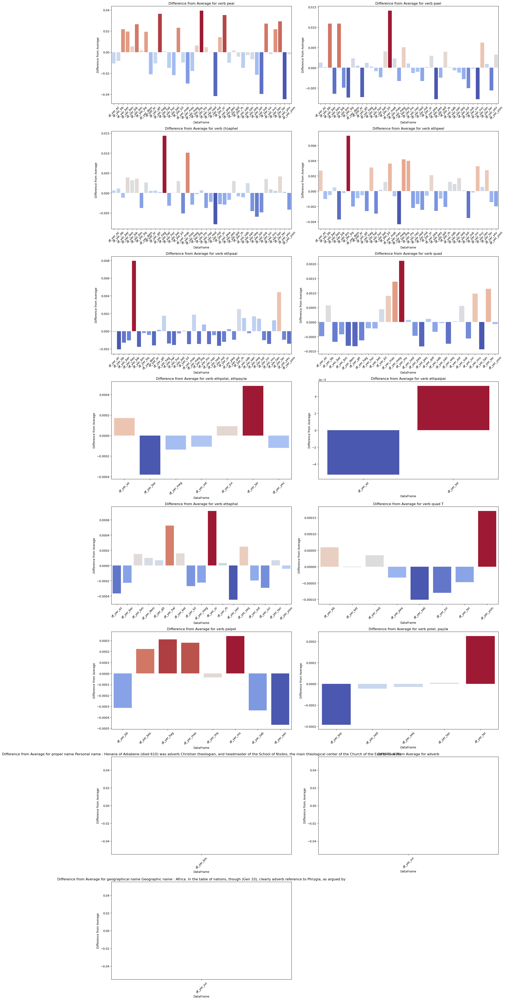

In [53]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Prepare the data for plotting
diffs_list = []

for df_name, verb_count in lexicon_comparison.items():
    # Merge each DataFrame's lexicon ratio with the average ratios
    verb_count = verb_count.merge(pd.DataFrame(verb_avg_ratios.items(), columns=['lexicon', 'avg_ratio']),
                                  on='lexicon', how='left')
    # Calculate the difference between the current ratio and the average ratio
    verb_count['diff'] = verb_count['ratio'] - verb_count['avg_ratio']
    
    # Add the DataFrame name as a column
    verb_count['df_name'] = df_name
    
    # Append to the list
    diffs_list.append(verb_count[['lexicon', 'diff', 'df_name']])

# Concatenate all differences into a single DataFrame
diffs_df = pd.concat(diffs_list)

# Now create the plots for each lexicon type
unique_verbs = diffs_df['lexicon'].unique()
num_verbs = len(unique_verbs)
dfs_per_row = 2

# Calculate the number of rows needed
num_rows = (num_verbs + dfs_per_row - 1) // dfs_per_row

# Create subplots
fig, axes = plt.subplots(num_rows, dfs_per_row, figsize=(20, 6 * num_rows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Define a color map
cmap = plt.get_cmap('coolwarm')

# Plot the difference for each lexicon across all DataFrames
for idx, lexicon in enumerate(unique_verbs):
    # Filter data for the current lexicon
    lexicon_data = diffs_df[diffs_df['lexicon'] == lexicon]
    
    # Normalize the differences for color mapping
    norm = plt.Normalize(lexicon_data['diff'].min(), lexicon_data['diff'].max())
    colors = cmap(norm(lexicon_data['diff']))

    # Plotting the differences for this lexicon
    sns.barplot(x='df_name', y='diff', data=lexicon_data, palette=colors, ax=axes[idx])
    axes[idx].set_title(f'Difference from Average for {lexicon}')
    axes[idx].set_xlabel('DataFrame')
    axes[idx].set_ylabel('Difference from Average')
    axes[idx].tick_params(axis='x', rotation=45)

# Hide any unused subplots if the number of lexicons isn't a perfect multiple of dfs_per_row
for i in range(num_verbs, len(axes)):
    axes[i].set_visible(False)

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


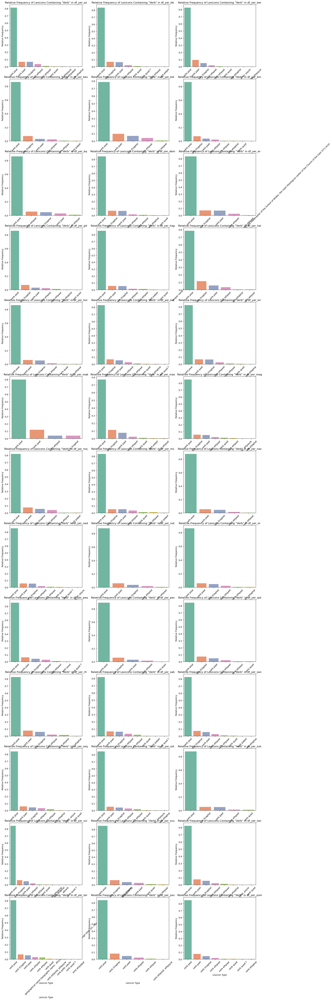

In [54]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

lexicon_comparison = {}

# Number of DataFrames to plot
num_dfs = len(arr_dfs_yer)
dfs_per_row = 3

# Calculate the number of rows needed
num_rows = (num_dfs + dfs_per_row - 1) // dfs_per_row

# Create subplots - Adjust the number of columns and rows as needed
fig, axes = plt.subplots(num_rows, dfs_per_row, figsize=(20, 6 * num_rows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Process each DataFrame
for idx, df_name in enumerate(arr_dfs_yer):
    # Access the DataFrame using globals()
    df = globals()[df_name]

    # Split the merged_lexicon into individual lexicons, strip spaces
    df_exploded = df['merged_lexicon'].str.split('|').apply(lambda x: [item.strip() for item in x]).explode()

    # Filter lexicons that contain the word 'verb' (case-insensitive)
    verb_df = df_exploded[df_exploded.str.contains('verb', case=False, na=False)]

    # Count occurrences of lexicons containing 'verb'
    verb_count = verb_df.value_counts().reset_index()
    verb_count.columns = ['lexicon', 'count']

    # Calculate the total number of verbs in the DataFrame
    total_verbs = verb_count['count'].sum()

    # Add a new column for the relative frequency (proportion of each verb type)
    verb_count['relative_frequency'] = verb_count['count'] / total_verbs

    # Store the results in the dictionary
    lexicon_comparison[df_name] = verb_count

    # Plotting the relative frequency bar graph for each DataFrame on its respective axis
    sns.barplot(x='lexicon', y='relative_frequency', data=verb_count, palette='Set2', ax=axes[idx])
    axes[idx].set_title(f'Relative Frequency of Lexicons Containing "Verb" in {df_name}')
    axes[idx].set_xlabel('Lexicon Type')
    axes[idx].set_ylabel('Relative Frequency')
    axes[idx].tick_params(axis='x', rotation=45)

# Hide any unused subplots if the number of DataFrames isn't a perfect multiple of dfs_per_row
for i in range(num_dfs, len(axes)):
    axes[i].set_visible(False)

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

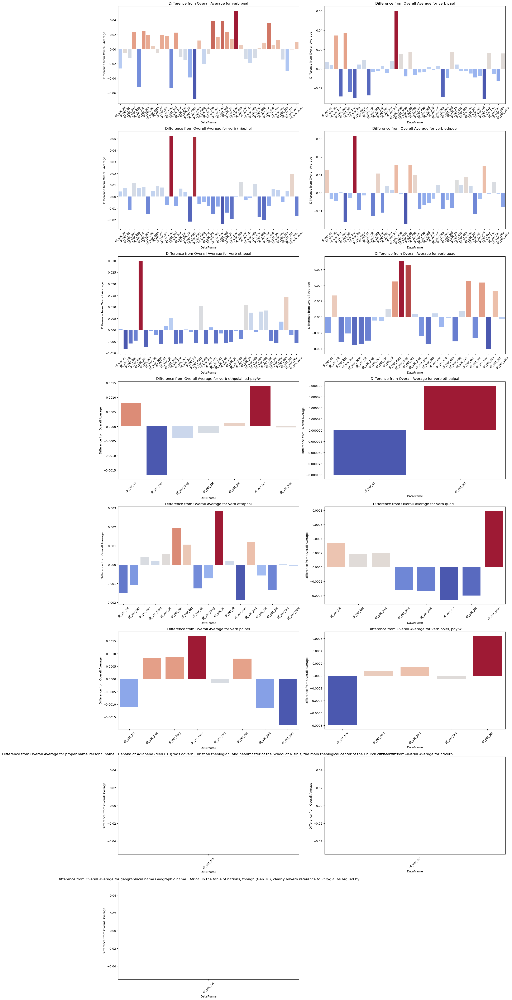

In [55]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Prepare the data for plotting
all_verb_counts = pd.concat([lexicon_comparison[df_name] for df_name in arr_dfs_yer])
overall_average = all_verb_counts.groupby('lexicon')['relative_frequency'].mean().reset_index()
overall_average.rename(columns={'relative_frequency': 'overall_avg'}, inplace=True)

# Step 2: Create a new DataFrame to compare each DataFrame's average with the overall average
comparison_list = []

for df_name, verb_count in lexicon_comparison.items():
    # Merge with overall average
    merged = verb_count.merge(overall_average, on='lexicon', how='left')
    
    # Calculate the difference
    merged['diff'] = merged['relative_frequency'] - merged['overall_avg']
    merged['df_name'] = df_name
    
    # Append to the list
    comparison_list.append(merged[['lexicon', 'relative_frequency', 'overall_avg', 'diff', 'df_name']])

# Concatenate all comparisons into a single DataFrame
comparison_df = pd.concat(comparison_list)

# Step 3: Now create the plots for each lexicon type
unique_verbs = comparison_df['lexicon'].unique()
num_verbs = len(unique_verbs)
dfs_per_row = 2

# Calculate the number of rows needed
num_rows = (num_verbs + dfs_per_row - 1) // dfs_per_row

# Create subplots
fig, axes = plt.subplots(num_rows, dfs_per_row, figsize=(20, 6 * num_rows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Define a color map
cmap = plt.get_cmap('coolwarm')

# Plot the differences for each lexicon across all DataFrames
for idx, lexicon in enumerate(unique_verbs):
    # Filter data for the current lexicon
    lexicon_data = comparison_df[comparison_df['lexicon'] == lexicon]
    
    # Normalize the differences for color mapping
    norm = plt.Normalize(lexicon_data['diff'].min(), lexicon_data['diff'].max())
    colors = cmap(norm(lexicon_data['diff']))

    # Plotting the differences for this lexicon
    sns.barplot(x='df_name', y='diff', data=lexicon_data, palette=colors, ax=axes[idx])
    axes[idx].set_title(f'Difference from Overall Average for {lexicon}')
    axes[idx].set_xlabel('DataFrame')
    axes[idx].set_ylabel('Difference from Overall Average')
    axes[idx].tick_params(axis='x', rotation=45)

# Hide any unused subplots if the number of lexicons isn't a perfect multiple of dfs_per_row
for i in range(num_verbs, len(axes)):
    axes[i].set_visible(False)

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

# Count of "noun" in Each DataFrame

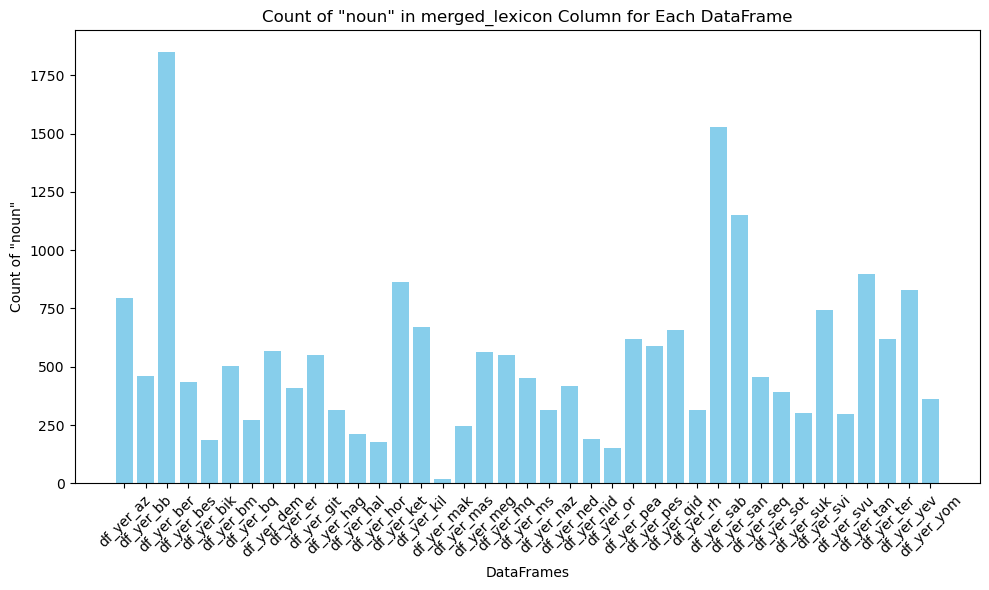

In [56]:
# Dictionary to store counts of 'noun' for each DataFrame
noun_counts = {}

# Count occurrences of 'verb' in the 'merged_lexicon' column for each DataFrame
for df_name in arr_dfs_yer:
    df = globals().get(df_name)  # Retrieve the DataFrame by name
    if df is not None:
        count = df['merged_lexicon'].str.contains('noun', case=False, na=False).sum()
        noun_counts[df_name] = count

# Plot the results
plt.figure(figsize=(10, 6))
plt.bar(verb_counts.keys(), noun_counts.values(), color='skyblue')
plt.xlabel('DataFrames')
plt.ylabel('Count of "noun"')
plt.title('Count of "noun" in merged_lexicon Column for Each DataFrame')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Count of Lexicons Containing "Noun" an ratio

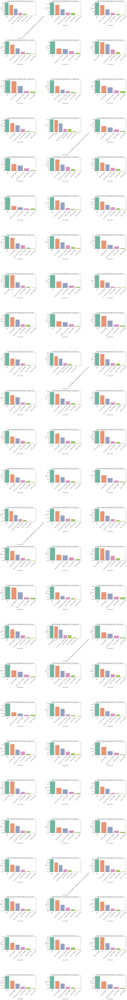

In [57]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Number of DataFrames to plot
num_dfs = len(arr_dfs_yer)
dfs_per_row = 3

# Calculate the number of rows needed
num_rows = (num_dfs + dfs_per_row - 1) // dfs_per_row

# Create subplots - Adjust the number of columns and rows as needed
fig, axes = plt.subplots(num_rows * 2, dfs_per_row, figsize=(20, 6 * num_rows * 2))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Process each DataFrame
for idx, df_name in enumerate(arr_dfs_yer):
    # Access the DataFrame using globals()
    df = globals()[df_name]

    # Split the merged_lexicon into individual lexicons, strip spaces
    df_exploded = df['merged_lexicon'].str.split('|').apply(lambda x: [item.strip() for item in x]).explode()

    # Filter lexicons that contain the word 'noun' (case-insensitive)
    noun_df = df_exploded[df_exploded.str.contains('noun', case=False, na=False)]

    # Count occurrences of lexicons containing 'noun'
    noun_count = noun_df.value_counts().reset_index()
    noun_count.columns = ['lexicon', 'count']

    # Calculate the total number of rows in the DataFrame
    total_rows = len(df)

    # Calculate the ratio of each lexicon count to the total number of rows
    noun_count['ratio'] = noun_count['count'] / total_rows

    # Store the results in the dictionary
    lexicon_comparison[df_name] = noun_count

    # Plotting the bar graph for absolute counts
    sns.barplot(x='lexicon', y='count', data=noun_count, palette='Set2', ax=axes[idx])
    axes[idx].set_title(f'Count of Lexicons Containing "Noun" in {df_name}')
    axes[idx].set_xlabel('Lexicon Type')
    axes[idx].set_ylabel('Count')
    axes[idx].tick_params(axis='x', rotation=45)

    # Plotting the bar graph for ratios
    sns.barplot(x='lexicon', y='ratio', data=noun_count, palette='Set2', ax=axes[idx + num_dfs])
    axes[idx + num_dfs].set_title(f'Ratio of Lexicons Containing "Noun" in {df_name}')
    axes[idx + num_dfs].set_xlabel('Lexicon Type')
    axes[idx + num_dfs].set_ylabel('Ratio')
    axes[idx + num_dfs].tick_params(axis='x', rotation=45)

# Hide any unused subplots if the number of DataFrames isn't a perfect multiple of dfs_per_row
for i in range(num_dfs * 2, len(axes)):
    axes[i].set_visible(False)

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


In [58]:
import pandas as pd
import matplotlib.pyplot as plt

# Function to perform the analysis on a given CSV file
def analyze_lexicon_combinations_and_text_length(df):
   
    # Fill NaN values in lexicon columns with 'None' for easier handling
    df_filled = df.fillna('None')

    # Replace 'No data' with 'None' so that they can be excluded
    df_filled = df_filled.replace('No data', 'None')

    # Create a new column that combines all lexicon columns, excluding 'None' values
    df_filled['lexicon_combination'] = df_filled[['lexicon_0', 'lexicon_1', 'lexicon_2', 'lexicon_3', 'lexicon_4']].apply(
        lambda row: tuple(x for x in row if x != 'None'), axis=1)

    # Filter out rows where the combination is empty (no valid lexicon entries)
    df_filled = df_filled[df_filled['lexicon_combination'].apply(len) > 0]

    # Group by these combinations and count their occurrences
    lexicon_combinations_count = df_filled.groupby('lexicon_combination').size().reset_index(name='count')

    # Sort by count for better visualization
    lexicon_combinations_count_sorted = lexicon_combinations_count.sort_values(by='count', ascending=False).head(10)

    # Analyze text length vs merged lexicon type
    df_filled['text_length'] = df_filled['text'].apply(len)

    # Group by merged_lexicon and get the average text length for each lexicon type
    text_length_by_lexicon = df_filled.groupby('merged_lexicon')['text_length'].mean().reset_index()

    # Plot 1: Most Common Lexicon Combinations
    plt.figure(figsize=(10, 6))
    plt.barh(lexicon_combinations_count_sorted['lexicon_combination'].astype(str), lexicon_combinations_count_sorted['count'], color='skyblue')
    plt.xlabel('Count')
    plt.ylabel('Lexicon Combinations')
    plt.title('Top 10 Most Common Lexicon Combinations')
    plt.gca().invert_yaxis()  # To display the most common at the top
    plt.show()



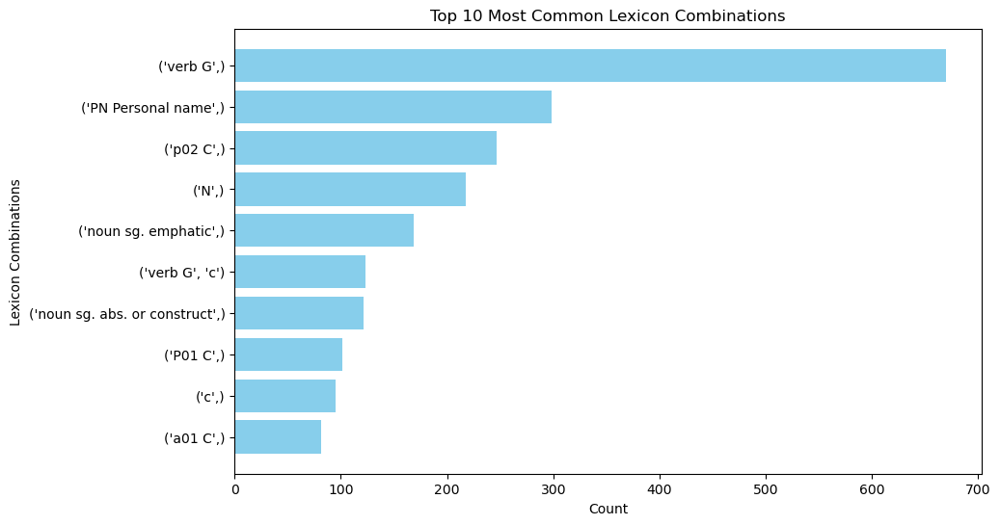

In [59]:
analyze_lexicon_combinations_and_text_length(df_yer_az)

# Only about the shared Maskhtot in Bavli and Yerushalmi

# Bavli

In [60]:
# List of DataFrame names to select
selected_dfs = [
    "df_az", "df_bb", "df_ber", "df_bes", "df_bm", "df_bq", "df_er", "df_git",
    "df_hag", "df_hor", "df_ket", "df_mak", "df_meg", "df_mq", "df_naz", "df_ned",
    "df_nid", "df_pes", "df_qid", "df_rh", "df_sab", "df_san", "df_sot", "df_suk",
    "df_svu", "df_tan", "df_yev", "df_yom"
]

# Filter df_dict to include only the selected DataFrames
filtered_df_dict = {key: df_dict[key] for key in selected_dfs if key in df_dict}

# filtered_df_dict now contains only the selected DataFrames


In [61]:
# Print the names of the DataFrames in filtered_df_dict
print("Selected DataFrame names:")
for df_name in filtered_df_dict.keys():
    print(df_name)


Selected DataFrame names:
df_az
df_bb
df_ber
df_bes
df_bm
df_bq
df_er
df_git
df_hag
df_hor
df_ket
df_mak
df_meg
df_mq
df_naz
df_ned
df_nid
df_pes
df_qid
df_rh
df_sab
df_san
df_sot
df_suk
df_svu
df_tan
df_yev
df_yom


In [62]:
from collections import defaultdict
import pandas as pd

def add_word_percentage_feature(df_dict, column_name="Lema", new_feature_name="word_percentage", total_word_type="bavli"):
    """
    Adds a word percentage feature based on the column `column_name` and the type of total words (either "bavli" or "yersushalmi").
    Excludes `None` or "No data" from the word count and percentage calculation, but sets their word percentage to 0.

    Parameters:
        df_dict (dict): Dictionary where keys are DataFrame names and values are DataFrames.
        column_name (str): The column containing words to count. Default is "Lema".
        new_feature_name (str): The name of the new feature (column) to add. Default is "word_percentage".
        total_word_type (str): Type of total word count. Can be "bavli" or "yersushalmi".

    Returns:
        dict: Updated dictionary with DataFrames containing the new feature.
    """
    # Step 1: Create a hashmap to count occurrences of words across all DataFrames
    word_count = defaultdict(int)
    total_words = 0

    # Populate the word count hashmap and calculate total words
    for name, df in df_dict.items():
        if column_name in df.columns:
            for word in df[column_name]:
                if word not in ["None"] and not pd.isna(word):  # Exclude None, "No data", and NaN
                    word_count[word] += 1
                    total_words += 1

    # Calculate percentages for each word
    word_percentage = {word: (count / total_words) * 100 for word, count in word_count.items()}

    # Step 2: Add the word percentage as a new feature in each DataFrame
    updated_dict = {}
    for name, df in df_dict.items():
        if column_name in df.columns:
            # Map word percentage to the column, setting 0 for None or "No data"
            df[new_feature_name] = df[column_name].map(lambda x: word_percentage.get(x, 0))
            updated_dict[name] = df
        else:
            print(f"Warning: Column '{column_name}' not found in DataFrame '{name}'. Skipping...")
            updated_dict[name] = df  # Include unmodified DataFrame

    return updated_dict

def add_word_percentage_bavli_feature(df_dict):
    return add_word_percentage_feature(df_dict, column_name="Lema", new_feature_name="word_percentage", total_word_type="bavli")

def add_word_percentage_yerushalmi_feature(df_dict):
    return add_word_percentage_feature(df_dict, column_name="Lema", new_feature_name="word_percentage", total_word_type="yerushalmi")

In [63]:
# Assume filtered_df_dict is already defined and populated
filtered_df_dict = add_word_percentage_bavli_feature(filtered_df_dict)
    


In [64]:
df_az

,text,url,lexicon_0,lexicon_1,lexicon_2,lexicon_3,lexicon_4,meaning_0,meaning_1,meaning_2,meaning_3,text_transformed,Lema,merged_lexicon,merged_meanings,word_percentage
0,xd,"Masekhet: 71026, Page: 002, Side: 1, Line: 07,...",n01,None,None,None,None,one,None,None,None,חד,xd,numeral singular absolute or construct,one,0.663998
16038,t)ny,"Masekhet: 71026, Page: 002, Side: 1, Line: 07,...",verb G,None,None,None,None,to repeat,"to narrate, recite",to sift flour [< Rabbinic Hebrew],None,תאני,tny,verb peal,"to repeat | to narrate, recite | to sift flour...",0.949530
16039,""")ydyhN"";","Masekhet: 71026, Page: 002, Side: 1, Line: 07,...",No data,None,None,None,None,None,None,None,None,אידיהן;,None,No data,None,0.000000
16037,wxd,"Masekhet: 71026, Page: 002, Side: 1, Line: 07,...",c,n01,None,None,None,"and, also",one,None,None,וחד,xd,conjunction | numeral singular absolute or con...,"and, also | one",0.663998
16036,t)ny,"Masekhet: 71026, Page: 002, Side: 1, Line: 07,...",verb G,None,None,None,None,to repeat,"to narrate, recite",to sift flour [< Rabbinic Hebrew],None,תאני,tny,verb peal,"to repeat | to narrate, recite | to sift flour...",0.949530
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255,lyh;,"Masekhet: 71026, Page: 076, Side: 2, Line: 19,...",p,None,None,None,None,"to, for",None,None,None,ליה;,l_,preposition,"to, for",7.111383
251,)ydkr,"Masekhet: 71026, Page: 076, Side: 2, Line: 19,...",verb Gt,None,None,None,None,"to remember, be mindful of",to be remembered,None,None,אידכר,dkr,verb ethpeel,"to remember, be mindful of | to be remembered",0.042942
253,m)y,"Masekhet: 71026, Page: 076, Side: 2, Line: 19,...",P01,None,None,None,None,what,None,None,None,מאי,m)y,preposition independent,what,1.668648
252,d(bdt,"Masekhet: 71026, Page: 076, Side: 2, Line: 20,...",c,verb G,None,None,None,to make,"to do, perform, act in a certain manner","to designate, make into",idiomatic expressions:,דעבדת,(bd,conjunction | verb peal,"to make | to do, perform, act in a certain man...",0.699570


# Yerushalmi

In [65]:
# List of DataFrame names to select and modify with "_yer"
selected_dfs_yer = ['df_yer_az', 'df_yer_bb', 'df_yer_ber', 'df_yer_bes', 'df_yer_bm', 'df_yer_bq', 'df_yer_er', 'df_yer_git', 
 'df_yer_hag', 'df_yer_hor', 'df_yer_ket', 'df_yer_mak', 'df_yer_meg', 'df_yer_mq', 'df_yer_naz', 'df_yer_ned',
 'df_yer_nid', 'df_yer_pes', 'df_yer_qid', 'df_yer_rh', 'df_yer_sab', 'df_yer_san', 'df_yer_sot', 'df_yer_suk',
 'df_yer_svu', 'df_yer_tan', 'df_yer_yev', 'df_yer_yom']


filtered_df_dict_yer = {key: df_dict_yer[key] for key in selected_dfs_yer if key in df_dict_yer}


In [66]:
filtered_df_dict_yer = add_word_percentage_yerushalmi_feature(filtered_df_dict_yer)


In [67]:
df_yer_nid

,text,url,lexicon_0,lexicon_1,lexicon_2,lexicon_3,lexicon_4,meaning_0,meaning_1,meaning_2,meaning_3,text_transformed,Lema,merged_lexicon,merged_meanings,word_percentage
0,r',"Masekhet: 5330039, Page: 48, Side: d, Line: 45...",N,None,None,None,None,chief; teacher,None,None,None,ר',rby#2 rby#2 noun sg. abs. or construct,noun,chief; teacher,5.870366
1190,)my,"Masekhet: 5330039, Page: 48, Side: d, Line: 45...",PN Personal name,None,None,None,None,None,None,None,None,אמי,)my,proper name Personal name,None,0.101135
1189,b(y,"Masekhet: 5330039, Page: 48, Side: d, Line: 45...",verb G,None,None,None,None,"to seek, look for",to ask a question,"to wish for something, want, request",to require,בעי,b(y,verb peal,"to seek, look for | to ask a question | to wis...",0.656624
1187,mtnyt',"Masekhet: 5330039, Page: 48, Side: d, Line: 45...",noun sg. emphatic,None,None,None,None,tannaitic tradition,None,None,None,מתנית',mtny,noun sg. emphatic,tannaitic tradition,0.475486
1188,dl),"Masekhet: 5330039, Page: 48, Side: d, Line: 45...",c,a01,None,None,None,"no, not",None,None,None,דלא,l),conjunction | a01,"no, not",1.735901
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21,z(yr),"Masekhet: 5330039, Page: 51, Side: a, Line: 32...",PN Personal name,None,None,None,None,None,None,None,None,זעירא,z(yr),proper name Personal name,None,0.187175
20,mxwy,"Masekhet: 5330039, Page: 51, Side: a, Line: 32...",verb D,None,None,None,None,to show,"to announce, i.e., reveal previously unknown i...",to display apparent behavior,None,מחוי,xwy,verb pael,"to show | to announce, i.e., reveal previously...",0.016604
18,lxbryy),"Masekhet: 5330039, Page: 51, Side: a, Line: 32...",p03,noun pl. emphatic,None,None,None,comrade,None,None,None,לחברייא,xbr,preposition proclitic | noun pl. emphatic,comrade,0.268687
16,"""pdxtw","Masekhet: 5330039, Page: 51, Side: a, Line: 32...",No data,None,None,None,None,None,None,None,None,פדחתו,None,No data,None,0.000000


# group_by_line_process

In [68]:
def line_process(df_dict):
    """
    Processes a dictionary of DataFrames by applying `group_by_line` and `split_merged_lexicon`
    to each DataFrame and storing the results in a new dictionary.

    Parameters:
    - df_dict (dict): A dictionary where keys are DataFrame names and values are DataFrames.

    Returns:
    - dict: A dictionary containing processed DataFrames for each line.
    """
    processed_dict = {}  # Dictionary to store the processed DataFrames

    for df_name, df in df_dict.items():
        # Group by line using `group_by_line`
        grouped_lines = group_by_line(df, df_name)  # This returns a dictionary of line DataFrames

        split_lines_dict = {}  # Temporary dictionary for storing split results for each line

        for line_name, line_df in grouped_lines.items():
            # Apply `split_merged_lexicon` to each DataFrame
            split_lines_dict[line_name] = split_merged_lexicon(line_df)

        # Store the processed line DataFrames in the main dictionary
        processed_dict[df_name] = split_lines_dict

    return processed_dict


## Group_by_line

In [69]:
import pandas as pd

def group_by_line(df, df_name):
    """
    Processes a DataFrame, extracts page, side, and line information from the 'url' column, 
    and groups rows based on the unique combination of 'Page', 'Side', and 'Line'.
    Handles both numeric and alphabetic side values and dynamically selects 
    'word_percentage_yersushalmi' or 'word_percentage_bavli' as needed.

    Parameters:
    - df (pd.DataFrame): Input DataFrame containing columns 'text', 'merged_lexicon', and 'url'.
    - df_name (str): Name of the DataFrame to include in the dictionary keys.

    Returns:
    - dict: A dictionary where keys are line identifiers (e.g., 'df_line_19') and values are DataFrames.
    """

    # Extract 'Page', 'Side', and 'Line' information from the 'url' column
    df['Page'] = df['url'].str.extract(r'Page:\s*(\d+)')  # Extract numeric Page values
    df['Side'] = df['url'].str.extract(r'Side:\s*([a-dA-D]|\d+)')  # Extract Side values (letters or numbers)
    df['Line'] = df['url'].str.extract(r'Line:\s*(\d+)')  # Extract numeric Line values

    # Determine which word percentage column to use
    word_percentage_column = 'word_percentage'

    # Filter required columns
    columns_to_extract = ['text', 'merged_lexicon', word_percentage_column, 'Page', 'Side', 'Line']
    df_filtered = df[columns_to_extract].dropna(subset=['Page', 'Side', 'Line'])

    # Combine 'Page', 'Side', and 'Line' to create a unique identifier for each line
    df_filtered['UniqueLine'] = df_filtered['Page'] + "_" + df_filtered['Side'] + "_" + df_filtered['Line']

    # Group by the unique identifier
    grouped_lines = df_filtered.groupby('UniqueLine')

    # Create separate DataFrames for each line
    line_dfs = {}
    for idx, (unique_line, group) in enumerate(grouped_lines):
        line_df = group[['text', 'merged_lexicon', word_percentage_column]].reset_index(drop=True)
        line_dfs[f"{df_name}_line_{idx}"] = line_df

    return line_dfs


## Split_merged_lexicon

In [70]:
def split_merged_lexicon(df):
    """
    Splits the 'merged_lexicon' column into multiple columns based on delimiters '|', 'verb ###', 'verb', and 'noun'.

    Parameters:
    - df (pd.DataFrame): Input DataFrame containing the 'merged_lexicon' column.

    Returns:
    - pd.DataFrame: A new DataFrame with split columns.
    """
    # Replace 'verb ' and 'noun ' with delimiters before splitting
    df['merged_lexicon'] = df['merged_lexicon'].str.replace(r'\bverb\b', 'verb|')
    df['merged_lexicon'] = df['merged_lexicon'].str.replace(r'\bnoun\b', 'noun|')

    # Split based on the updated pattern
    split_patterns = r'[|]'
    split_columns = df['merged_lexicon'].str.split(split_patterns, expand=True)

    # Rename split columns dynamically
    split_columns.columns = [f'lexicon_split_{i}' for i in range(split_columns.shape[1])]



    # Concatenate original dataframe with split columns
    new_df = pd.concat([df, split_columns], axis=1)
    
     # Drop the 'merged_lexicon' column
    new_df.drop(columns=['text','merged_lexicon'], inplace=True)

    return new_df

# Create two dicts

In [71]:
dict_bav = line_process(filtered_df_dict)

In [72]:
dict_bav['df_bb']['df_bb_line_2']

,word_percentage,lexicon_split_0,lexicon_split_1,lexicon_split_2
0,0.493512,conjunction,noun,sg. emphatic
1,0.000000,No data,None,None
2,1.628270,interjection,None,None
3,0.000000,No data,None,None
4,0.000000,No data,None,None
5,4.430714,adverb,None,None


In [73]:
dict_yer = line_process(filtered_df_dict_yer)

In [93]:
dict_yer['df_yer_az']['df_yer_az_line_17']

,word_percentage,lexicon_split_0,lexicon_split_1,lexicon_split_2
0,1.073240,numeral singular absolute or construct (h)aphel,None,None
1,0.001509,noun,sg. abs. or construct,None
2,0.034718,verb,(h)aphel,None
3,5.870366,preposition proclitic,noun,
4,0.122268,proper name Personal name,None,None
5,0.095097,noun,,None
6,1.073240,numeral singular absolute or construct (h)aphel,None,None
7,0.001509,noun,sg. abs. or construct,None


# Create lexicon

In [256]:
# Step 1: Collect DataFrames Without Duplicating Name/Label in Rows
datasets = {}  # Dictionary to store DataFrames separately

# Define the list of required lexicon_split columns
required_columns = [f"lexicon_split_{i}" for i in range(8)]

for main_label, main_dict in [("bav", dict_bav), ("yer", dict_yer)]:
    for sub_dict in main_dict.values():
        for name, df in sub_dict.items():
            df = df.copy()  # Avoid modifying the original DataFrame

            # Store "label" and "name" as metadata, not columns
            df.attrs["label"] = main_label  
            df.attrs["name"] = name  

            # Remove "label" and "name" if they exist in columns
            df = df.drop(columns=["label", "name"], errors="ignore")

            # Check for missing lexicon_split columns and add them with None values
            missing_columns = [col for col in required_columns if col not in df.columns]
            for col in missing_columns:
                df[col] = None  # Add the missing columns with None values

            # ✅ Apply text cleaning (strip leading/trailing spaces & convert to lowercase)
            for col in required_columns:
                if col in df.columns:  
                    df[col] = df[col].astype(str).str.strip().str.lower()

            # Store in dataset dictionary
            datasets[name] = df


In [259]:
datasets['df_az_line_0']

,word_percentage,lexicon_split_0,lexicon_split_1,lexicon_split_2,lexicon_split_3,lexicon_split_4,lexicon_split_5,lexicon_split_6,lexicon_split_7
0,0.663998,numeral singular absolute or construct,none,none,none,none,none,none,none
1,0.949530,verb,peal,none,none,none,none,none,none
2,0.000000,no data,none,none,none,none,none,none,none
3,0.663998,conjunction,numeral singular absolute or construct,none,none,none,none,none,none
4,0.949530,verb,peal,none,none,none,none,none,none
5,0.000000,no data,none,none,none,none,none,none,none
6,0.503767,preposition independent,none,none,none,none,none,none,none


In [260]:
# Check attributes
print(datasets['df_az_line_0'].attrs["label"])  # Should print: bav
print(datasets['df_az_line_0'].attrs["name"])   # Should print: df_az_line_0

bav
df_az_line_0


In [261]:
# Step 2: Identify text and numeric features
text_features = set()
numeric_features = set()

for df in datasets.values():
    text_features.update(df.select_dtypes(exclude=['float64', 'int64']).columns.difference(['label', 'name']))
    numeric_features.update(df.select_dtypes(include=['float64', 'int64']).columns)

In [262]:
text_features = list(text_features)
numeric_features = list(numeric_features)

# Filter unique values from the lexicon features 

In [341]:
# Step 3: Count unique text values appearing more than 500 times
value_counts = {}

for df in datasets.values():
    for col in text_features:
        if col in df.columns:  # ✅ Check if column exists before accessing
            for val in df[col].dropna():
                if isinstance(val, str):  # Only consider text values
                    value_counts[val] = value_counts.get(val, 0) + 1

# Step 4: Filter values that appear more than 500 times
frequent_values = {val for val, count in value_counts.items() if count > 500}

In [342]:
len(value_counts)

116

In [343]:
len(frequent_values) 

40

# Create vector of the unique values for each row 

In [344]:
# Ensure frequent_values is a list
value_counts = list(value_counts)

# Initialize the new DataFrame to hold the vectorized columns (A, B, C)
df_vectorized = pd.DataFrame(columns=value_counts)


In [270]:
print(len(value_counts))

116


In [271]:
# Final processed datasets
processed_datasets = {}

# Iterate through each DataFrame
for name, df in datasets.items():
    df_copy = df.copy()  # Keep the original structure

    # Ensure frequent_values is a list
    value_counts = list(value_counts)

    # Initialize the new DataFrame to hold the vectorized columns (A, B, C)
    df_vectorized = pd.DataFrame(columns=value_counts)

    # Initialize occurrence matrix
    occurrence_matrix = np.zeros((df.shape[0], len(value_counts)), dtype=int)
    value_to_index = {val: idx for idx, val in enumerate(value_counts)}

    # Replace text features with occurrence vectors
    for row_idx, row in df.iterrows():
        new_features = np.zeros(len(value_counts), dtype=int)  # Create row vector
        
        # Vectorize lexicon_split_0 and lexicon_split_1 columns
        for col in text_features:
            if col in df.columns:  # ✅ Check if column exists
                val = row[col]
                if isinstance(val, str) and val in value_to_index:
                    new_features[value_to_index[val]] += 1  # Count occurrences

        # Assign vectorized data to the new DataFrame
        df_vectorized.loc[row_idx] = new_features

    # Drop original text features from the original DataFrame
    df_copy = df_copy.drop(columns=text_features)

    # Loop through numeric_features to ensure all numeric columns are included
    numeric_data = df_copy[numeric_features] if numeric_features else pd.DataFrame()

    # Concatenate vectorized data with numeric features
    df_final = pd.concat([df_vectorized, numeric_data], axis=1)

    # Store label and name as attributes
    df_final.attrs["label"] = df.attrs["label"]  # Replace with actual label if available
    df_final.attrs["name"] = name

    # Store the processed DataFrame
    processed_datasets[name] = df_final

In [311]:
# Iterate over processed_datasets and drop specified columns
for df_name, df in processed_datasets.items():
    df.drop(columns=["none", "proper name personal name : henana of adiabene (died 610) was adverb christian theologian, and headmaster of the school of nisibis, the main theological center of the church of the east (571–610)","proper name personal name"], errors="ignore", inplace=True)


In [401]:
processed_datasets['df_az_line_0'] 

,peal,numeral singular absolute or construct,verb,no data,conjunction,preposition independent,ethpaal,adverb,sg. emphatic,noun,...,numeral singular determined (h)aphel,"a01 (h)aphel no single lemma like above in data, number of rows is 0",geographical name geographic name : babylon,antioch,proper name personal name : alexander,c02,"numeral singular absolute or construct (h)aphel ""unrecognizable query or no such lemma found""",numeral plural determined (h)aphel,geographical name geographic name : asia minor,word_percentage
0,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.663998
1,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.949530
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.000000
3,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.663998
4,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.949530
5,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.000000
6,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.503767


# Graph of lines

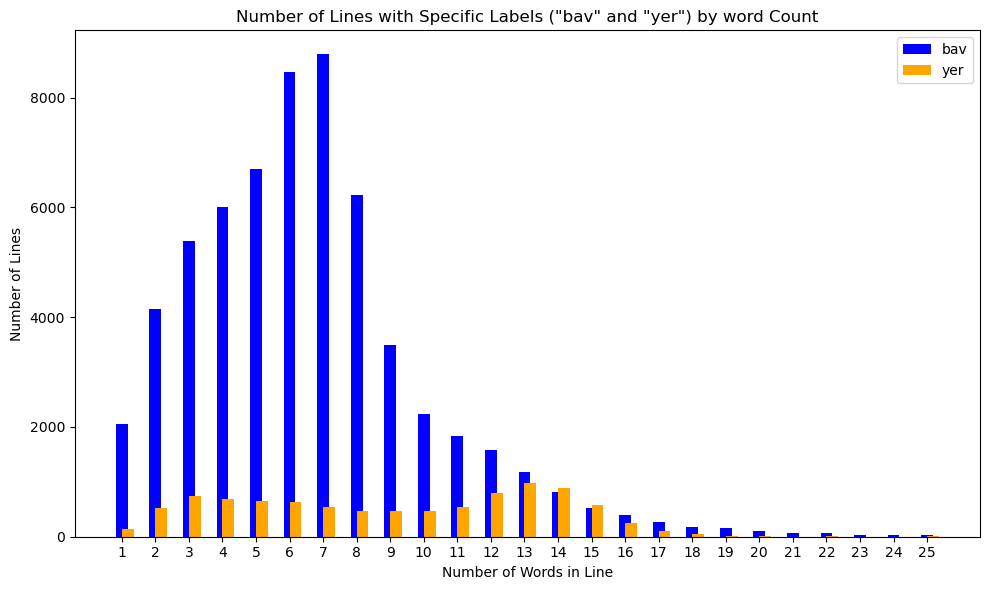

In [313]:
import matplotlib.pyplot as plt
from collections import defaultdict

# Initialize a dictionary to count how many DataFrames have a certain row count for "bav" and "yer"
row_count_dict = defaultdict(lambda: {'bav': 0, 'yer': 0})

# Iterate through each DataFrame in the datasets
for df_name, df in datasets.items():
    # Get the Label attribute (either 'bav' or 'yer')
    label = df.attrs.get("label")  # Get the 'Label' attribute

    if label not in ['bav', 'yer']:
        continue  # Skip DataFrames without the 'Label' attribute being 'bav' or 'yer'
    
    # Get the total number of rows in the DataFrame
    total_rows = len(df)
    
    # If the total rows are between 1 and 25, count the occurrences of 'bav' or 'yer'
    if 1 <= total_rows <= 25:
        row_count_dict[total_rows][label] += 1  # Increment the count for 'bav' or 'yer'

# Prepare the data for plotting
row_numbers = list(range(1, 26))  # From 1 to 25 rows
bav_counts = [row_count_dict[row]['bav'] for row in row_numbers]
yer_counts = [row_count_dict[row]['yer'] for row in row_numbers]

# Create the plot
plt.figure(figsize=(10, 6))

# Bar chart showing the number of DataFrames per row count, separated by label type ('bav' and 'yer')
bar_width = 0.35
x = range(1, 26)

# Plot bars for 'bav' and 'yer'
plt.bar(x, bav_counts, width=bar_width, label='bav', color='blue', align='center')
plt.bar(x, yer_counts, width=bar_width, label='yer', color='orange', align='edge')

# Labels and title
plt.xlabel('Number of Words in Line')
plt.ylabel('Number of Lines')
plt.title('Number of Lines with Specific Labels ("bav" and "yer") by word Count')
plt.xticks(x)  # Show x-ticks for every number from 1 to 25
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


# Down Sample

In [314]:
import random
from collections import defaultdict

# Set random seed for reproducibility
random.seed(42)

# Step 1: Initialize dictionaries to store "bav" and "yer" DataFrames by row count
row_count_dict_bav = defaultdict(list)
row_count_dict_yer = defaultdict(list)

# Step 2: Organize DataFrames by label and row count
for df_name, df in processed_datasets.items():
    label = df.attrs.get("label")

    if label not in ['bav', 'yer']:
        continue  # Skip DataFrames without the 'Label' attribute being 'bav' or 'yer'

    total_rows = len(df)

    if 1 <= total_rows <= 25:  # Ensure row count is between 1 and 25
        if label == 'bav':
            row_count_dict_bav[total_rows].append(df)  # Store actual DataFrame
        else:
            row_count_dict_yer[total_rows].append(df)  # Store actual DataFrame

# Step 3: Perform downsampling for each row count
downsampled_datasets = {}

for row_count in range(1, 26):
    bav_dfs = row_count_dict_bav[row_count]
    yer_dfs = row_count_dict_yer[row_count]

    # If one label is empty, keep the available DataFrames as they are
    if not bav_dfs or not yer_dfs:
        downsampled_datasets[row_count] = {
            'bav': bav_dfs,
            'yer': yer_dfs
        }
        continue  # Skip to the next iteration

    # Determine the minimum count to match both labels
    num_to_keep = min(len(bav_dfs), len(yer_dfs))

    # Downsample the larger group
    downsampled_bav_dfs = random.sample(bav_dfs, num_to_keep) if len(bav_dfs) > num_to_keep else bav_dfs
    downsampled_yer_dfs = random.sample(yer_dfs, num_to_keep) if len(yer_dfs) > num_to_keep else yer_dfs

    # Store balanced DataFrames
    downsampled_datasets[row_count] = {
        'bav': downsampled_bav_dfs,
        'yer': downsampled_yer_dfs
    }

# Step 4: Rebuild the processed DataFrames after downsampling
final_datasets = {}

for row_count, label_dfs in downsampled_datasets.items():
    for label, dfs in label_dfs.items():
        for idx, df in enumerate(dfs):
            # Assign a unique name using row count, label, and index
            dataset_name = f"{label}_{row_count}_{idx}"
            final_datasets[dataset_name] = df



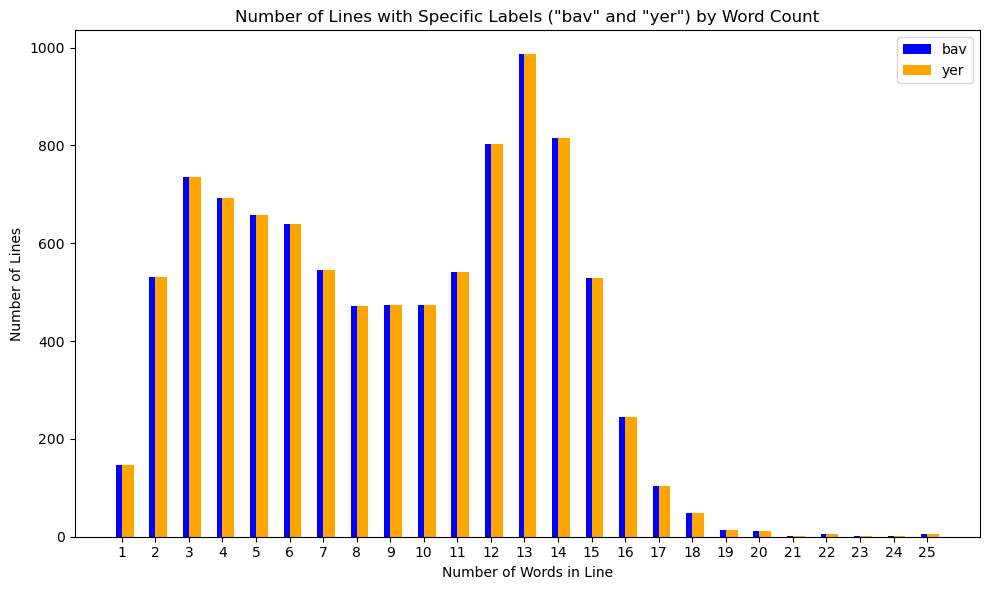

In [315]:
import matplotlib.pyplot as plt
from collections import defaultdict

# Initialize a dictionary to count how many DataFrames have a certain row count for "bav" and "yer"
row_count_dict = defaultdict(lambda: {'bav': 0, 'yer': 0})

# Iterate through each downsampled DataFrame in the final_datasets
for df_name, df in final_datasets.items():
    # Get the Label attribute (either 'bav' or 'yer')
    label = df.attrs.get("label")  # Get the 'Label' attribute

    if label not in ['bav', 'yer']:
        continue  # Skip DataFrames without the 'Label' attribute being 'bav' or 'yer'
    
    # Get the total number of rows in the DataFrame
    total_rows = len(df)
    
    # If the total rows are between 1 and 25, count the occurrences of 'bav' or 'yer'
    if 1 <= total_rows <= 25:
        row_count_dict[total_rows][label] += 1  # Increment the count for 'bav' or 'yer'

# Prepare the data for plotting
row_numbers = list(range(1, 26))  # From 1 to 25 rows
bav_counts = [row_count_dict[row]['bav'] for row in row_numbers]
yer_counts = [row_count_dict[row]['yer'] for row in row_numbers]

# Create the plot
plt.figure(figsize=(10, 6))

# Bar chart showing the number of DataFrames per row count, separated by label type ('bav' and 'yer')
bar_width = 0.35
x = range(1, 26)

# Plot bars for 'bav' and 'yer'
plt.bar(x, bav_counts, width=bar_width, label='bav', color='blue', align='center')
plt.bar(x, yer_counts, width=bar_width, label='yer', color='orange', align='edge')

# Labels and title
plt.xlabel('Number of Words in Line')
plt.ylabel('Number of Lines')
plt.title('Number of Lines with Specific Labels ("bav" and "yer") by Word Count')
plt.xticks(x)  # Show x-ticks for every number from 1 to 25
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


In [316]:
# Step 5: Count the total number of "bav" and "yer" DataFrames in final_datasets
total_bav = 0
total_yer = 0

for df_name, df in final_datasets.items():
    # Extract the label from the DataFrame name (it's part of the name as "{df_name}_bav_row_count")
    if 'bav' in df_name:
        total_bav += 1
    elif 'yer' in df_name:
        total_yer += 1

# Print the total counts
print(f"Total number of 'bav' DataFrames: {total_bav}")
print(f"Total number of 'yer' DataFrames: {total_yer}")


Total number of 'bav' DataFrames: 9482
Total number of 'yer' DataFrames: 9482


Row Count 1 - Train Size: 235, Test Size: 59
Epoch 1/5
8/8 - 8s - loss: 0.6828 - accuracy: 0.6085 - val_loss: 0.6830 - val_accuracy: 0.5593 - 8s/epoch - 958ms/step
Epoch 2/5
8/8 - 0s - loss: 0.6762 - accuracy: 0.6511 - val_loss: 0.6785 - val_accuracy: 0.5254 - 295ms/epoch - 37ms/step
Epoch 3/5
8/8 - 0s - loss: 0.6704 - accuracy: 0.6851 - val_loss: 0.6744 - val_accuracy: 0.5593 - 253ms/epoch - 32ms/step
Epoch 4/5
8/8 - 0s - loss: 0.6655 - accuracy: 0.6809 - val_loss: 0.6704 - val_accuracy: 0.5763 - 238ms/epoch - 30ms/step
Epoch 5/5
8/8 - 0s - loss: 0.6613 - accuracy: 0.6766 - val_loss: 0.6668 - val_accuracy: 0.5593 - 250ms/epoch - 31ms/step
Saved model for row count 1 at saved_models\lstm_model_row_1.h5
2/2 [==============================] - 1s 11ms/step
Row Count 1 - Accuracy: 0.5593
Row Count 2 - Train Size: 851, Test Size: 213
Epoch 1/5
27/27 - 8s - loss: 0.6774 - accuracy: 0.5946 - val_loss: 0.6630 - val_accuracy: 0.7277 - 8s/epoch - 293ms/step
Epoch 2/5
27/27 - 1s - loss: 0.6489 - 

Epoch 3/5
28/28 - 3s - loss: 0.2563 - accuracy: 0.8902 - val_loss: 0.2182 - val_accuracy: 0.9124 - 3s/epoch - 91ms/step
Epoch 4/5
28/28 - 3s - loss: 0.2344 - accuracy: 0.9168 - val_loss: 0.1954 - val_accuracy: 0.9217 - 3s/epoch - 96ms/step
Epoch 5/5
28/28 - 3s - loss: 0.1749 - accuracy: 0.9341 - val_loss: 0.1796 - val_accuracy: 0.9355 - 3s/epoch - 96ms/step
Saved model for row count 11 at saved_models\lstm_model_row_11.h5
7/7 [==============================] - 1s 35ms/step
Row Count 11 - Accuracy: 0.9355
Row Count 12 - Train Size: 1283, Test Size: 321
Epoch 1/5
41/41 - 10s - loss: 0.6209 - accuracy: 0.7069 - val_loss: 0.5005 - val_accuracy: 0.8037 - 10s/epoch - 250ms/step
Epoch 2/5
41/41 - 4s - loss: 0.2819 - accuracy: 0.9018 - val_loss: 0.1763 - val_accuracy: 0.9315 - 4s/epoch - 109ms/step
Epoch 3/5
41/41 - 4s - loss: 0.1802 - accuracy: 0.9306 - val_loss: 0.1381 - val_accuracy: 0.9502 - 4s/epoch - 106ms/step
Epoch 4/5
41/41 - 5s - loss: 0.1231 - accuracy: 0.9525 - val_loss: 0.1190 - v

Epoch 5/5
1/1 - 0s - loss: 0.6271 - accuracy: 1.0000 - val_loss: 0.7703 - val_accuracy: 0.0000e+00 - 178ms/epoch - 178ms/step
Saved model for row count 21 at saved_models\lstm_model_row_21.h5
1/1 [==============================] - 1s 919ms/step
Row Count 21 - Accuracy: 0.0000
Row Count 22 - Train Size: 9, Test Size: 3
Epoch 1/5
1/1 - 6s - loss: 0.7063 - accuracy: 0.5556 - val_loss: 0.6208 - val_accuracy: 1.0000 - 6s/epoch - 6s/step
Epoch 2/5
1/1 - 0s - loss: 0.6844 - accuracy: 0.5556 - val_loss: 0.6316 - val_accuracy: 1.0000 - 227ms/epoch - 227ms/step
Epoch 3/5
1/1 - 0s - loss: 0.6648 - accuracy: 0.6667 - val_loss: 0.6424 - val_accuracy: 1.0000 - 231ms/epoch - 231ms/step
Epoch 4/5
1/1 - 0s - loss: 0.6472 - accuracy: 0.8889 - val_loss: 0.6530 - val_accuracy: 0.6667 - 218ms/epoch - 218ms/step
Epoch 5/5
1/1 - 0s - loss: 0.6312 - accuracy: 0.8889 - val_loss: 0.6633 - val_accuracy: 0.6667 - 220ms/epoch - 220ms/step
Saved model for row count 22 at saved_models\lstm_model_row_22.h5
1/1 [=====

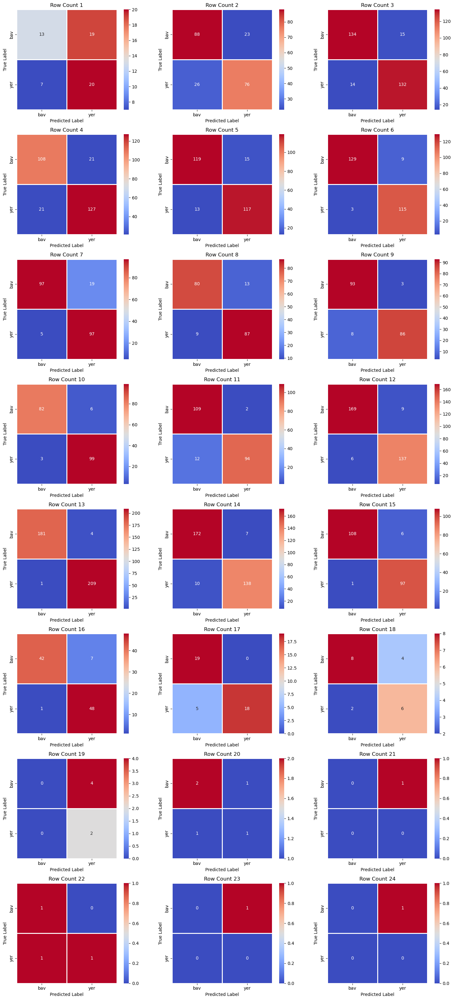

In [320]:
import os
import numpy as np
import random
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.utils import to_categorical

# Set random seed for reproducibility
random.seed(42)
np.random.seed(42)

# Create directory to store models
MODEL_DIR = "saved_models"
os.makedirs(MODEL_DIR, exist_ok=True)

# Store accuracy results for each row count
results = {}

# Define a function to preprocess data for LSTM
def preprocess_for_lstm(df):
    """Prepares features (X) and labels (y) for LSTM."""
    label = df.attrs["label"]  # Extract 'bav' or 'yer'
    y = 0 if label == 'bav' else 1  # Convert label to binary (0 for 'bav', 1 for 'yer')
    
    # Extract features by removing the 'label' column and reshape for LSTM
    X = df.drop(columns=[col for col in df.columns if col == 'label'], errors='ignore').values
    X = np.reshape(X, (1, X.shape[0], X.shape[1]))  # Treat entire DataFrame as one sample
    return X, y

# ✅ Extract `bav` and `yer` DataFrames from final_datasets correctly
row_count_dict_bav = {row_count: [] for row_count in range(1, 25)}
row_count_dict_yer = {row_count: [] for row_count in range(1, 25)}

for dataset_name, df in final_datasets.items():
    parts = dataset_name.split("_")  # Example: "bav_3_2"
    if len(parts) < 3:
        continue  # Skip malformed names

    label, row_count = parts[0], int(parts[1])

    if row_count > 24:
        continue  # Skip rows greater than 24

    if label == 'bav':
        row_count_dict_bav[row_count].append(df)
    elif label == 'yer':
        row_count_dict_yer[row_count].append(df)

# Store confusion matrices for later display
confusion_matrices = {}

# ✅ Loop over row counts (1 to 24)
for row_count in range(1, 25):
    bav_dfs = row_count_dict_bav.get(row_count, [])
    yer_dfs = row_count_dict_yer.get(row_count, [])

    if not bav_dfs or not yer_dfs:
        print(f"Skipping row count {row_count} due to insufficient data.")
        continue

    # Prepare feature sets and labels
    X_all, y_all = [], []
    
    for df in bav_dfs + yer_dfs:
        X, y = preprocess_for_lstm(df)
        X_all.append(X)
        y_all.append(y)
    
    X_all = np.vstack(X_all)
    y_all = np.array(y_all)
    y_all = to_categorical(y_all, num_classes=2)

    X_train, X_test, y_train, y_test = train_test_split(X_all, y_all, test_size=0.2, random_state=42)

    print(f"Row Count {row_count} - Train Size: {X_train.shape[0]}, Test Size: {X_test.shape[0]}")

    # Build and train LSTM model
    model = Sequential([
        LSTM(units=50, input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=False),
        Dense(2, activation='softmax')
    ])
    
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    model.fit(X_train, y_train, epochs=5, batch_size=32, validation_data=(X_test, y_test), verbose=2)
    
    # Save model
    model_path = os.path.join(MODEL_DIR, f"lstm_model_row_{row_count}.h5")
    model.save(model_path)
    print(f"Saved model for row count {row_count} at {model_path}")
    
    # Evaluate model
    y_pred = model.predict(X_test)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true = np.argmax(y_test, axis=1)
    
    accuracy = accuracy_score(y_true, y_pred_classes)
    results[row_count] = accuracy
    cm = confusion_matrix(y_true, y_pred_classes)
    confusion_matrices[row_count] = cm
    print(f"Row Count {row_count} - Accuracy: {accuracy:.4f}")

# ✅ Plot confusion matrices
num_plots = len(confusion_matrices)
rows = (num_plots // 3) + (1 if num_plots % 3 else 0)
fig, axes = plt.subplots(rows, 3, figsize=(15, rows * 4))

for i, (row_count, cm) in enumerate(confusion_matrices.items()):
    ax = axes[i // 3, i % 3]
    sns.heatmap(cm, annot=True, fmt='d', cmap='coolwarm', linewidths=1, square=True,
                xticklabels=['bav', 'yer'], yticklabels=['bav', 'yer'], ax=ax)
    ax.set_title(f'Row Count {row_count}')
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('True Label')

for j in range(i + 1, rows * 3):
    fig.delaxes(axes[j // 3, j % 3])

plt.tight_layout()
plt.show()


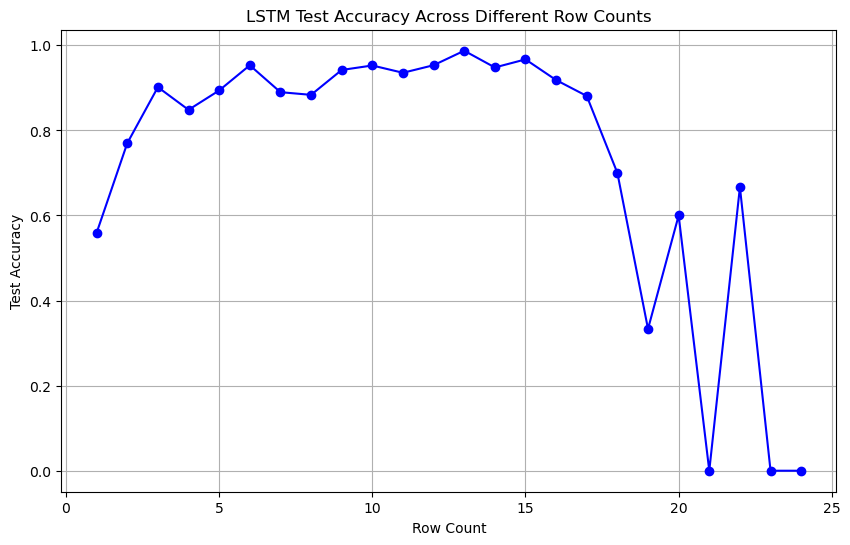

In [321]:
# Plot accuracy trends for different row counts
plt.figure(figsize=(10, 6))
plt.plot(list(results.keys()), list(results.values()), marker='o', linestyle='-', color='b')
plt.xlabel("Row Count")
plt.ylabel("Test Accuracy")
plt.title("LSTM Test Accuracy Across Different Row Counts")
plt.grid(True)
plt.show()

# Analyze

                                                      bav    yer
word                                                            
peal                                                15737  16385
numeral singular absolute or construct                810     21
verb                                                21016  19516
no data                                             19193  20505
conjunction                                         12842   9176
...                                                   ...    ...
proper name personal name : alexander                   0      3
c02                                                     0      1
numeral singular absolute or construct (h)aphel...      0      1
numeral plural determined (h)aphel                      0      1
geographical name geographic name : asia minor          0      1

[113 rows x 2 columns]


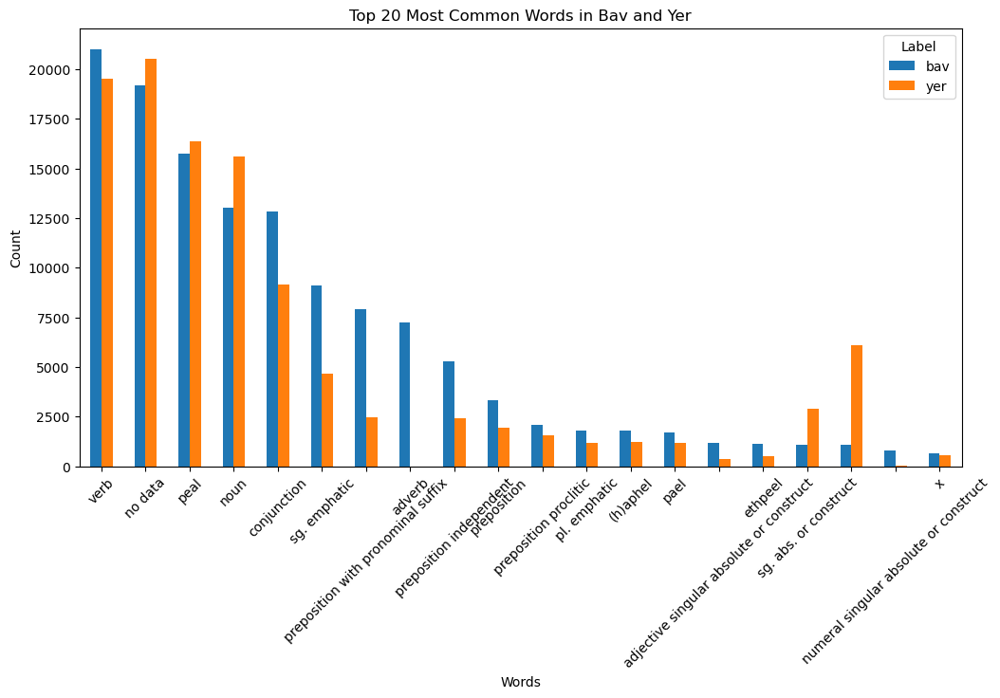

In [322]:
import pandas as pd
import matplotlib.pyplot as plt
from collections import defaultdict

# Dictionary to store the counts of words for both "bav" and "yer"
word_counts = defaultdict(lambda: {'bav': 0, 'yer': 0})

# Iterate through each DataFrame in final_datasets
for df_name, df in final_datasets.items():
    label = df.attrs.get("label")  # Extract the label (either 'bav' or 'yer')
    
    if label not in ['bav', 'yer']:
        continue  # Skip DataFrames without a valid label

    # Iterate over all columns except those containing "word_percentage"
    for column in df.columns:
        if "word_percentage" in column:
            continue  # Skip word_percentage columns

        # Count how many 1's are in the column for the current DataFrame
        count_1s = df[column].eq(1).sum()  # Sum the occurrences of 1

        # Add the count to the appropriate label (either 'bav' or 'yer')
        word_counts[column][label] += count_1s

# Convert the dictionary to a DataFrame
word_count_df = pd.DataFrame.from_dict(word_counts, orient="index").fillna(0)

# Rename the index to 'word'
word_count_df.index.name = "word"

# Print the DataFrame for checking the results
print(word_count_df)

# Select the top 20 most common words based on the total count in both labels
top_20 = word_count_df.sort_values(by=["bav", "yer"], ascending=False).head(20)

# Plot the top 20 words by their count in 'bav' and 'yer'
top_20.plot(kind="bar", figsize=(12, 6), title="Top 20 Most Common Words in Bav and Yer")
plt.ylabel("Count")
plt.xlabel("Words")
plt.xticks(rotation=45)
plt.legend(title="Label")
plt.show()


In [412]:
word_count_df['min_freq'] = word_count_df[['bav', 'yer']].min(axis=1)
common_words = word_count_df[word_count_df['min_freq'] > 0].sort_values(by='min_freq', ascending=False)
print("Most balanced words:", common_words.head(10))


Most balanced words:                                       bav    yer     ratio  yer_bav_ratio  \
word                                                                        
verb                                21016  19516  1.076860       0.928626   
no data                             19193  20505  0.936016       1.068358   
peal                                15737  16385  0.960452       1.041177   
noun                                13047  15592  0.836775       1.195064   
conjunction                         12842   9176  1.399520       0.714530   
sg. emphatic                         9104   4682  1.944468       0.514279   
preposition with pronominal suffix   7923   2461  3.219423       0.310615   
preposition independent              5268   2424  2.173267       0.460137   
preposition                          3325   1956  1.699898       0.588271   
preposition proclitic                2071   1573  1.316592       0.759536   

                                    min_freq  
word   

In [323]:
import matplotlib.pyplot as plt

# Avoid division by zero by replacing zeros with NaN before computing the ratio
word_count_df["ratio"] = word_count_df["bav"] / word_count_df["yer"]
word_count_df["ratio"].replace([float("inf"), -float("inf")], float("nan"), inplace=True)  # Handle infinite values
word_count_df["ratio"].fillna(0, inplace=True)  # Replace NaN values with 0

# Sort by ratio in descending order
word_count_df_sorted = word_count_df.sort_values(by="ratio", ascending=False)



Top 20 Highest Bav/Yer Ratios:
                                                         ratio
word                                                          
numeral singular determined                         198.500000
numeral singular absolute or construct               38.571429
interjection                                         28.800000
i01                                                   6.119048
ethpalpal                                             5.000000
pl. emphatic"unrecognizable query or no such le...    3.500000
adjective singular absolute or construct              3.469388
pl. construct                                         3.464286
preposition with pronominal suffix                    3.219423
ethpaal                                               2.779070
ettaphal                                              2.500000
ethpeel                                               2.275510
adjective plural determined                           2.215190
preposition independent 

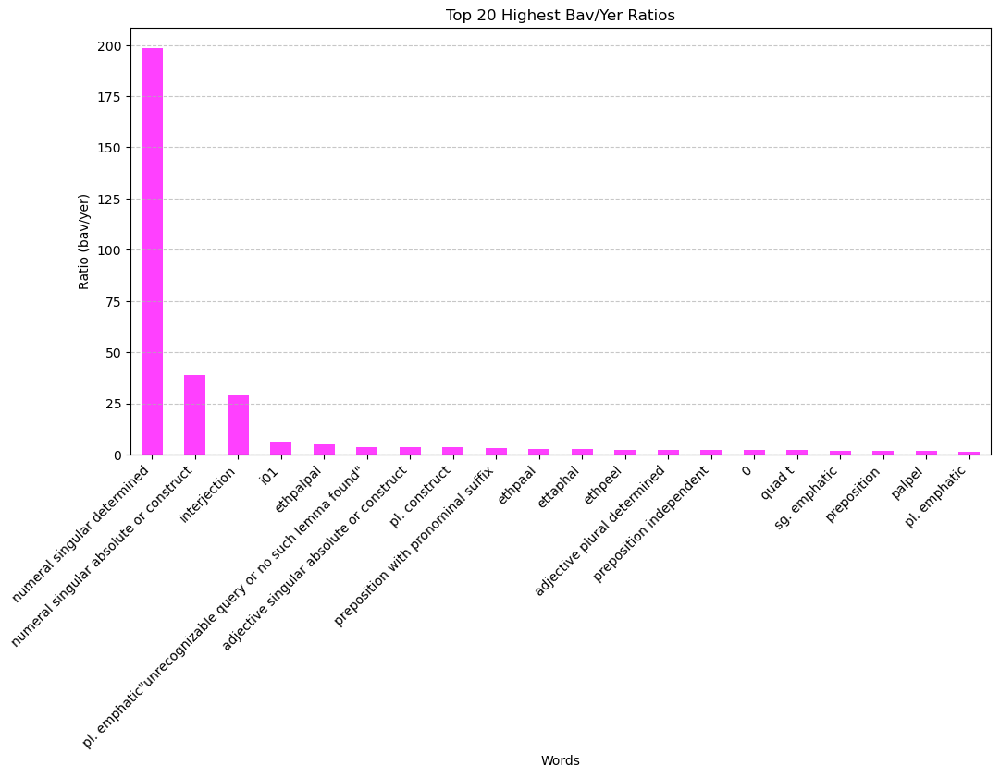

In [324]:
import matplotlib.pyplot as plt

# Avoid division by zero by replacing zeros with NaN before computing the ratio
word_count_df["ratio"] = word_count_df["bav"] / word_count_df["yer"]
word_count_df["ratio"].replace([float("inf"), -float("inf")], float("nan"), inplace=True)  # Handle infinite values
word_count_df["ratio"].fillna(0, inplace=True)  # Replace NaN values with 0

# Sort by ratio in descending order
word_count_df_sorted = word_count_df.sort_values(by="ratio", ascending=False)

# Select the top 20 highest ratios
top_20_ratio = word_count_df_sorted.head(20)

# Print the top 20 bav/yer ratios
print("Top 20 Highest Bav/Yer Ratios:")
print(top_20_ratio[["ratio"]])

# Plot the top 20 ratios
plt.figure(figsize=(12, 6))
top_20_ratio["ratio"].plot(kind="bar", color="magenta", alpha=0.75)
plt.title("Top 20 Highest Bav/Yer Ratios")
plt.ylabel("Ratio (bav/yer)")
plt.xlabel("Words")
plt.xticks(rotation=45, ha="right")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()


Top 20 Highest Yer/Bav Ratios:
                               yer_bav_ratio
word                                        
a01                                59.666667
b                                  17.823529
pl. absolute                        6.820000
r                                   5.875862
                                    5.743180
sg. abs. or construct               2.727955
ethpolal, ethpay/w                  1.600000
noun                                1.195064
no data                             1.068358
peal                                1.041177
adjective                           0.970000
verb                                0.928626
adjective plural absolute           0.861702
x                                   0.840804
adjective singular determined       0.771704
preposition proclitic               0.759536
v                                   0.732787
conjunction                         0.714530
quad                                0.712644
pael                    

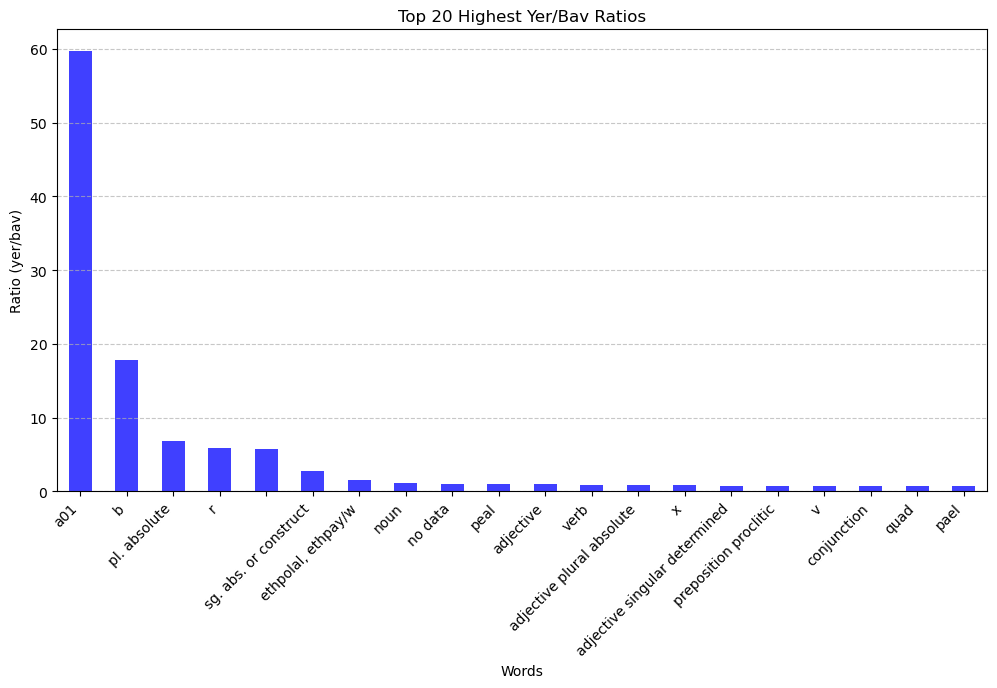

In [327]:
import matplotlib.pyplot as plt

# Avoid division by zero by replacing zeros with NaN before computing the ratio
word_count_df["yer_bav_ratio"] = word_count_df["yer"] / word_count_df["bav"]
word_count_df["yer_bav_ratio"].replace([float("inf"), -float("inf")], float("nan"), inplace=True)  # Handle infinite values
word_count_df["yer_bav_ratio"].fillna(0, inplace=True)  # Replace NaN values with 0

# Sort by yer/bav ratio in descending order
word_count_df_sorted = word_count_df.sort_values(by="yer_bav_ratio", ascending=False)

# Select the 20 highest yer/bav ratios
top_20_ratio = word_count_df_sorted.head(20)

# Print the top 20 ratios
print("Top 20 Highest Yer/Bav Ratios:")
print(top_20_ratio[["yer_bav_ratio"]])

# Plot the top 20 yer/bav ratios
plt.figure(figsize=(12, 6))
top_20_ratio["yer_bav_ratio"].plot(kind="bar", color="blue", alpha=0.75)
plt.title("Top 20 Highest Yer/Bav Ratios")
plt.ylabel("Ratio (yer/bav)")
plt.xlabel("Words")
plt.xticks(rotation=45, ha="right")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

In [328]:
import pandas as pd

# List to store DataFrames with label information
df_list = []

for df_name, df in final_datasets.items():
    label = df.attrs.get("label")  # Extract the label from attributes
    if label not in ['bav', 'yer']:
        continue  # Skip if the label is not valid

    df = df.copy()  # Ensure we don't modify the original DataFrame
    df["label"] = label  # Add the label as a new column
    df_list.append(df)  # Append to the list

# Concatenate all DataFrames into one
final_df = pd.concat(df_list, ignore_index=True)


In [329]:
final_df

,peal,numeral singular absolute or construct,verb,no data,conjunction,preposition independent,ethpaal,adverb,sg. emphatic,noun,...,"a01 (h)aphel no single lemma like above in data, number of rows is 0",geographical name geographic name : babylon,antioch,proper name personal name : alexander,c02,"numeral singular absolute or construct (h)aphel ""unrecognizable query or no such lemma found""",numeral plural determined (h)aphel,geographical name geographic name : asia minor,word_percentage,label
0,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0.006730,bav
1,1,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.140363,bav
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.037494,bav
3,0,0,0,0,0,0,0,0,1,2,...,0,0,0,0,0,0,0,0,0.051915,bav
4,1,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,6.030463,bav
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170183,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0.016604,yer
170184,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0.116230,yer
170185,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.036228,yer
170186,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0.016604,yer


In [330]:
# List of DataFrame names to select
selected_dfs_special = [
    "df_ned", "df_naz", "df_tam", "df_ker", "df_meil"]

# Filter df_dict to include only the selected DataFrames
filtered_df_dict_special = {key: df_dict[key] for key in selected_dfs_special if key in df_dict}

# filtered_df_dict now contains only the selected DataFrames

In [331]:
# Print the names of the DataFrames in filtered_df_dict
print("Selected DataFrame names:")
for df_name in filtered_df_dict_special.keys():
    print(df_name)

Selected DataFrame names:
df_ned
df_naz
df_tam
df_ker
df_meil


In [332]:
# Assume filtered_df_dict is already defined and populated
filtered_df_dict_special = add_word_percentage_bavli_feature(filtered_df_dict_special)

In [333]:
dict_special = line_process(filtered_df_dict_special)


In [334]:
dict_special['df_ned']['df_ned_line_2']


,word_percentage,lexicon_split_0,lexicon_split_1,lexicon_split_2
0,0.000000,No data,None,None
1,1.221131,conjunction,verb,peal
2,0.862756,noun,sg. emphatic,None
3,0.670295,conjunction,None,None
4,0.000000,No data,None,None
5,0.000000,No data,None,None


In [335]:
# Step 1: Collect DataFrames Without Duplicating Name/Label in Rows
datasets_special = {}  # Dictionary to store DataFrames separately

# Define the list of required lexicon_split columns
required_columns = [f"lexicon_split_{i}" for i in range(8)]

for main_label, main_dict in [("bav", dict_special)]:
    for sub_dict in main_dict.values():
        for name, df in sub_dict.items():
            df = df.copy()  # Avoid modifying the original DataFrame

            # Store "label" and "name" as metadata, not columns
            df.attrs["label"] = main_label  
            df.attrs["name"] = name  

            # Remove "label" and "name" if they exist in columns
            df = df.drop(columns=["label", "name"], errors="ignore")

            # Check for missing lexicon_split columns and add them with None values
            missing_columns = [col for col in required_columns if col not in df.columns]
            for col in missing_columns:
                df[col] = None  # Add the missing columns with None values

            # ✅ Apply text cleaning (strip leading/trailing spaces & convert to lowercase)
            for col in required_columns:
                if col in df.columns:  
                    df[col] = df[col].astype(str).str.strip().str.lower()

            # Store in dataset dictionary
            datasets_special[name] = df

In [336]:
datasets_special['df_ned_line_0']

,word_percentage,lexicon_split_0,lexicon_split_1,lexicon_split_2,lexicon_split_3,lexicon_split_4,lexicon_split_5,lexicon_split_6,lexicon_split_7
0,1.592779,preposition independent,none,none,none,none,none,none,none
1,0.371649,verb,peal,none,none,none,none,none,none
2,0.457924,preposition,none,none,none,none,none,none,none


In [337]:
# Step 2: Identify text and numeric features
text_features = set()
numeric_features = set()

for df in datasets_special.values():
    text_features.update(df.select_dtypes(exclude=['float64', 'int64']).columns.difference(['label', 'name']))
    numeric_features.update(df.select_dtypes(include=['float64', 'int64']).columns)

In [338]:
text_features = list(text_features)
numeric_features = list(numeric_features)

In [389]:
# Final processed datasets
processed_datasets_special = {}

# Iterate through each DataFrame
for name, df in datasets_special.items():
    df_copy = df.copy()  # Keep the original structure

    # Ensure frequent_values is a list
    value_counts = list(value_counts)

    # Initialize the new DataFrame to hold the vectorized columns (A, B, C)
    df_vectorized = pd.DataFrame(columns=value_counts)

    # Initialize occurrence matrix
    occurrence_matrix = np.zeros((df.shape[0], len(value_counts)), dtype=int)
    value_to_index = {val: idx for idx, val in enumerate(value_counts)}

    # Replace text features with occurrence vectors
    for row_idx, row in df.iterrows():
        new_features = np.zeros(len(value_counts), dtype=int)  # Create row vector
        
        # Vectorize lexicon_split_0 and lexicon_split_1 columns
        for col in text_features:
            if col in df.columns:  # ✅ Check if column exists
                val = row[col]
                if isinstance(val, str) and val in value_to_index:
                    new_features[value_to_index[val]] += 1  # Count occurrences

        # Assign vectorized data to the new DataFrame
        df_vectorized.loc[row_idx] = new_features

    # Drop original text features from the original DataFrame
    df_copy = df_copy.drop(columns=text_features)

    # Loop through numeric_features to ensure all numeric columns are included
    numeric_data = df_copy[numeric_features] if numeric_features else pd.DataFrame()

    # Concatenate vectorized data with numeric features
    df_final = pd.concat([df_vectorized, numeric_data], axis=1)

    # Store label and name as attributes
    df_final.attrs["label"] = df.attrs["label"]  # Replace with actual label if available
    df_final.attrs["name"] = name

    # Store the processed DataFrame
    processed_datasets_special[name] = df_final

In [390]:
# Iterate over processed_datasets and drop specified columns
for df_name, df in processed_datasets_special.items():
    df.drop(columns=["none", "proper name personal name : henana of adiabene (died 610) was adverb christian theologian, and headmaster of the school of nisibis, the main theological center of the church of the east (571–610)","proper name personal name"], errors="ignore", inplace=True)

In [392]:
processed_datasets_special['df_ned_line_0'] 

,peal,numeral singular absolute or construct,verb,no data,conjunction,preposition independent,ethpaal,adverb,sg. emphatic,noun,...,numeral singular determined (h)aphel,"a01 (h)aphel no single lemma like above in data, number of rows is 0",geographical name geographic name : babylon,antioch,proper name personal name : alexander,c02,"numeral singular absolute or construct (h)aphel ""unrecognizable query or no such lemma found""",numeral plural determined (h)aphel,geographical name geographic name : asia minor,word_percentage
0,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1.592779
1,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.371649
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.457924


In [394]:
import numpy as np
import os
import matplotlib.pyplot as plt
import pandas as pd
from tensorflow.keras.models import load_model

def preprocess_for_lstm_special(df):
    """Prepares features (X) for LSTM from a given DataFrame with any row count."""
    # Get the actual row count (time steps) from the DataFrame
    time_steps = df.shape[0]
    
    # Convert DataFrame to numpy array
    X = df.values  # Shape: [time_steps, num_features]
    
    # Reshape for LSTM: [samples, time steps, features]
    X = np.reshape(X, (1, time_steps, X.shape[1]))  # Shape: [1, time_steps, num_features]
    return X

# Define the directory where the models are stored
model_dir = "saved_models"

# Process each DataFrame in the dictionary silently
results = {}
class_labels = ['bav', 'yer']

for key, df in processed_datasets_special.items():
    row_count = df.shape[0]
    model_path = os.path.join(model_dir, f"lstm_model_row_{row_count}.h5")
    
    try:
        # Check if a model exists for this specific row count
        if os.path.exists(model_path):
            # Load the corresponding model
            model = load_model(model_path)
            
            # Preprocess the current DataFrame
            X_special = preprocess_for_lstm_special(df)
            
            # Make prediction
            y_pred_special = model.predict(X_special, verbose=0)[0]
            predicted_label = class_labels[np.argmax(y_pred_special)]
            probability = np.max(y_pred_special) * 100  # Convert to percentage
            
            # Store results
            results[key] = {
                'predicted_label': predicted_label,
                'confidence': f"{probability:.2f}%",
                'rows': row_count,
                'raw_probabilities': y_pred_special
            }
        else:
            results[key] = {'error': f"No model found for {row_count} rows"}
    except Exception as e:
        results[key] = {'error': str(e)}

# Now create visualization for the results
# First, let's organize the data for visualization
valid_results = {k: v for k, v in results.items() if 'error' not in v}

# Create a DataFrame from valid results
prediction_data = pd.DataFrame([
    {
        'key': key,
        'label': result['predicted_label'],
        'confidence': float(result['confidence'].strip('%')),
        'rows': result.get('rows', 0)
    }
    for key, result in valid_results.items()
])

# Count the predictions by label
label_counts = prediction_data['label'].value_counts()
total_predictions = len(prediction_data)



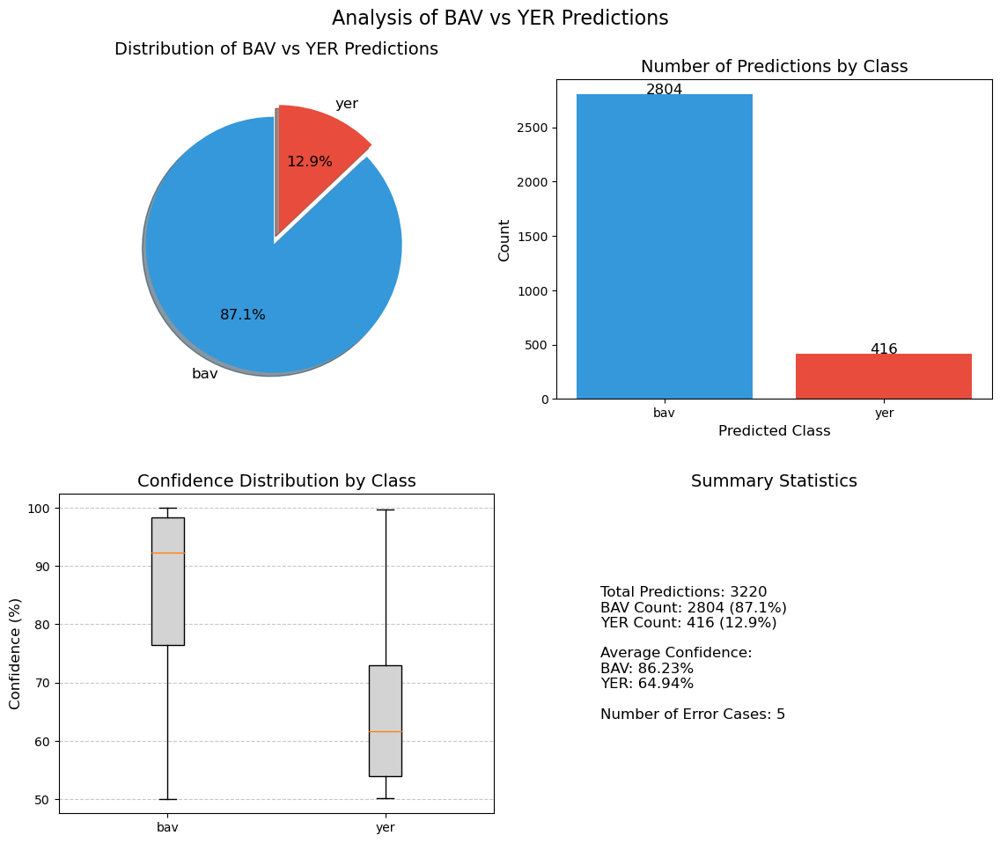

In [395]:
# 1. Create a pie chart to show overall distribution
plt.figure(figsize=(12, 10))

# Pie chart
plt.subplot(2, 2, 1)
colors = ['#3498db', '#e74c3c']  # Blue for 'bav', Red for 'yer'
explode = (0.05, 0.05)  # Explode both slices slightly
plt.pie(
    label_counts, 
    explode=explode, 
    labels=label_counts.index,
    autopct='%1.1f%%',
    colors=colors,
    shadow=True,
    startangle=90,
    textprops={'fontsize': 12}
)
plt.title('Distribution of BAV vs YER Predictions', fontsize=14, pad=20)

# 2. Bar chart for counts
plt.subplot(2, 2, 2)
bars = plt.bar(
    label_counts.index, 
    label_counts.values,
    color=colors[:len(label_counts)]
)
plt.xlabel('Predicted Class', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Number of Predictions by Class', fontsize=14)

# Add count labels on bars
for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width()/2.,
        height + 0.1,
        f'{height}',
        ha='center', 
        fontsize=12
    )

# 3. Confidence distribution by class
plt.subplot(2, 2, 3)
confidence_by_class = {}
for label in prediction_data['label'].unique():
    confidence_by_class[label] = prediction_data[prediction_data['label'] == label]['confidence'].values

plt.boxplot(
    list(confidence_by_class.values()),
    labels=list(confidence_by_class.keys()),
    patch_artist=True,
    boxprops={'facecolor': 'lightgrey'}
)
plt.ylabel('Confidence (%)', fontsize=12)
plt.title('Confidence Distribution by Class', fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# 4. Summary table
plt.subplot(2, 2, 4)
plt.axis('off')
summary_text = [
    f"Total Predictions: {total_predictions}",
    f"BAV Count: {label_counts.get('bav', 0)} ({label_counts.get('bav', 0)/total_predictions*100:.1f}%)",
    f"YER Count: {label_counts.get('yer', 0)} ({label_counts.get('yer', 0)/total_predictions*100:.1f}%)",
    f"\nAverage Confidence:",
    f"BAV: {prediction_data[prediction_data['label'] == 'bav']['confidence'].mean():.2f}%",
    f"YER: {prediction_data[prediction_data['label'] == 'yer']['confidence'].mean():.2f}%",
    f"\nNumber of Error Cases: {len(results) - len(valid_results)}"
]

plt.text(0.1, 0.5, '\n'.join(summary_text), fontsize=12, va='center')
plt.title('Summary Statistics', fontsize=14)

plt.tight_layout(pad=3.0)
plt.suptitle('Analysis of BAV vs YER Predictions', fontsize=16, y=0.98)
plt.subplots_adjust(top=0.9)

plt.show()

In [405]:
print(prediction_data['confidence'].describe())


count    3220.000000
mean       83.479488
std        16.050025
min        50.020000
25%        70.600000
50%        89.640000
75%        97.890000
max        99.980000
Name: confidence, dtype: float64


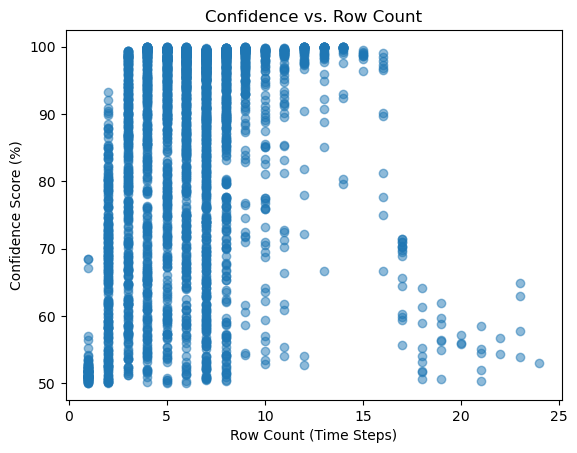

In [407]:
plt.scatter(prediction_data['rows'], prediction_data['confidence'], alpha=0.5)
plt.xlabel("Row Count (Time Steps)")
plt.ylabel("Confidence Score (%)")
plt.title("Confidence vs. Row Count")
plt.show()


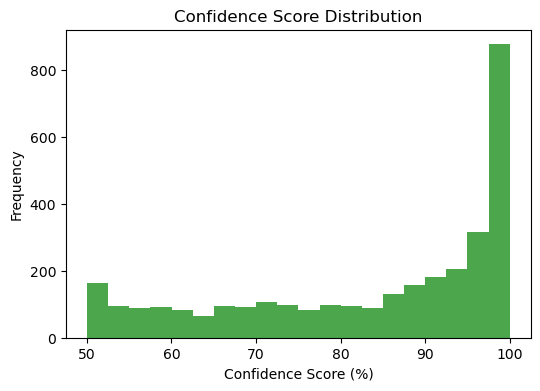

In [409]:
plt.figure(figsize=(6, 4))
plt.hist(prediction_data['confidence'], bins=20, color='green', alpha=0.7)
plt.xlabel("Confidence Score (%)")
plt.ylabel("Frequency")
plt.title("Confidence Score Distribution")
plt.show()


In [397]:
# For dictionaries of DataFrames, we need to iterate through the items
# Find common patterns in linguistic features across all datasets
def analyze_feature_frequency(datasets_dict):
    # Create an empty Series to store aggregated counts
    all_features_count = pd.Series()
    
    # Iterate through each DataFrame in the dictionary
    for key, df in datasets_dict.items():
        # Sum each column in the current DataFrame
        feature_sums = df.sum()
        # Add to our running total
        all_features_count = all_features_count.add(feature_sums, fill_value=0)
    
    # Sort to find most common features
    return all_features_count.sort_values(ascending=False)

# Get the most common features across all datasets
most_common_features = analyze_feature_frequency(processed_datasets_special).head(10)
print("Most common features:")
print(most_common_features)

# Analyze transitions between parts of speech for each dataset
def analyze_transitions(df):
    transitions = {}
    for i in range(len(df)-1):
        # Get the active feature for each row
        current_features = df.iloc[i].loc[df.iloc[i] == 1].index.tolist()
        next_features = df.iloc[i+1].loc[df.iloc[i+1] == 1].index.tolist()
        
        for curr in current_features:
            for nxt in next_features:
                pair = (curr, nxt)
                transitions[pair] = transitions.get(pair, 0) + 1
    return transitions

# Analyze transitions for each dataset
all_transitions = {}
for key, df in processed_datasets_special.items():
    all_transitions[key] = analyze_transitions(df)

# Find common transitions across datasets
def find_common_transitions(transitions_dict):
    all_counts = {}
    for dataset_key, transitions in transitions_dict.items():
        for pair, count in transitions.items():
            all_counts[pair] = all_counts.get(pair, 0) + count
    
    # Sort by frequency
    sorted_transitions = sorted(all_counts.items(), key=lambda x: x[1], reverse=True)
    return sorted_transitions

# Get most common transitions
common_transitions = find_common_transitions(all_transitions)[:10]
print("\nMost common feature transitions:")
for (feat1, feat2), count in common_transitions:
    print(f"{feat1} → {feat2}: {count} occurrences")

Most common features:
word_percentage                       20108.149721
verb                                   5024.000000
no data                                4756.000000
conjunction                            3830.000000
peal                                   3486.000000
noun                                   2659.000000
sg. emphatic                           1870.000000
preposition with pronominal suffix     1625.000000
adverb                                 1624.000000
preposition independent                1104.000000
dtype: float64

Most common feature transitions:
no data → no data: 2070 occurrences
conjunction → verb: 956 occurrences
verb → no data: 831 occurrences
verb → preposition with pronominal suffix: 819 occurrences
adverb → verb: 768 occurrences
conjunction → peal: 684 occurrences
verb → noun: 681 occurrences
no data → verb: 679 occurrences
verb → verb: 678 occurrences
noun → verb: 584 occurrences


In [422]:
import numpy as np
import shap
import tensorflow as tf
import os

# Load the trained model (example: for row count 5)
row_count = 5  # Example row count, change as needed
model_dir = 'path_to_model_directory'  # Define your model directory
model_path = os.path.join(model_dir, f"lstm_model_row_{row_count}.h5")
model = tf.keras.models.load_model(model_path)

# Select a dataset from `processed_datasets_special`
sample_df = processed_datasets_special["df_ned_line_0"]  # Replace with a valid key
X_sample = preprocess_for_lstm_special(sample_df)  # Shape: (1, time_steps, features)

# Check if the sample shape is correct
print(f"Shape of X_sample: {X_sample.shape}")  # Should print (1, time_steps, features)

# Create a background dataset for SHAP (use random samples if available)
background_data = np.random.randn(50, X_sample.shape[1], X_sample.shape[2])  # 50 synthetic samples

# Ensure the background data is in the correct shape for LSTM (time_steps, features)
print(f"Shape of background_data: {background_data.shape}")  # Should print (50, time_steps, features)

# Define the SHAP explainer
explainer = shap.Explainer(model, background_data)

# Compute SHAP values
shap_values = explainer(X_sample)

# Visualize the SHAP results
shap.summary_plot(shap_values, X_sample)


OSError: No file or directory found at path_to_model_directory\lstm_model_row_5.h5